In [1]:
import pandas as pd

In [2]:
import pandas as pd

# Load Digisonde data for all stations
digisonde_files = {
    # "ASCENSION ISLAND": "C:\\NOA\\Data\\Coincident\\AS00Q_20100113(013).pkl",
    "KWAJALEIN": "C:\\NOA\\Data\\Coincident\\KJ609_20100102(002).pkl",
    "JICAMARCA": "C:\\NOA\\Data\\Coincident\\JI91J_20100101(001).pkl",
    "EL ARENOSILLO": "C:\\NOA\\Data\\Coincident\\EA036_20100104(004).pkl",
    # "LOUISVALE": "C:\\NOA\\Data\\Coincident\\LV12P_20100114(014).pkl",
    # "BOULDER":"C:\\NOA\\Data\\Coincident\\BC840_20100101(001).pkl",
    # "RAMEY": "C:\\NOA\\Data\\Coincident\\PRJ18_20100317(076).pkl",
    # "CACHOEIRA PAULISTA":"C:\\NOA\\Data\\Coincident\\CAJ2M_20100101(001).pkl",
    # "I-CHEON":"C:\\NOA\\Data\\Coincident\\IC437_20100606(157).pkl",
    # "PT ARGUELLO": "C:\\NOA\\Data\\Coincident\\PA836_20100101(001).pkl",
    # "SAOLUIS": "C:\\NOA\\Data\\Coincident\\SAA0K_20100101(001).pkl",
    # "WALLOPS IS": "C:\\NOA\\Data\\Coincident\\WP937_20100101(001).pkl",
    # "ILORIN": "C:\\NOA\\Data\\Anomaly-station\\IL008_2010_n.pkl",

}

In [3]:
# Columns of interest
columns_to_plot = ['scaled_qf','scaled_qe','scaled_ff','scaled_fe']

In [4]:
# df[columns_to_plot].sort_values('sounding_timestamp')


In [5]:
# # Extract time only (HH:MM:SS) as string
# df['time_only'] = df['sounding_timestamp'].dt.strftime('%H:%M:%S')

# # Get unique times
# unique_times = df['time_only'].unique()

# print(unique_times)

In [6]:
# import pandas as pd

# # Load your full dataset (replace with your actual file or DataFrame)
# # df = pd.read_csv('your_file.csv')

# # Ensure datetime
# df['sounding_timestamp'] = pd.to_datetime(df['sounding_timestamp'])

# # Columns of interest
# columns_to_plot = ['scaled_foF2', 'scaled_foEs', 'scaled_foE', 'scaled_hF2', 'scaled_hEs']

# # Replace 9999.9 with 0.0

# df[columns_to_plot] = df[columns_to_plot].replace(9999., 0.0)

# # Convert sounding_timestamp to datetime
# df['sounding_timestamp'] = pd.to_datetime(df['sounding_timestamp'])

# # Extract time part (HH:MM:SS)
# df['time_only'] = df['sounding_timestamp'].dt.strftime('%H:%M:%S')
# df[columns_to_plot] = df[columns_to_plot].replace(9999., 0.0)
# # Extract month (can be just month or full "YYYY-MM" format)
# df['month'] = df['sounding_timestamp'].dt.to_period('M')

# # Replace placeholder values (like 9999) with NaN if they indicate missing data
# # df.replace(9999.0, pd.NA, inplace=True)

# # Group by month and time_only, then calculate the mean
# monthly_avg = df[columns_to_plot].groupby(['month', 'time_only']).mean(numeric_only=True).reset_index()

# print(monthly_avg)


In [7]:
# import pandas as pd

# # Ensure 'sounding_timestamp' is datetime
# df['sounding_timestamp'] = pd.to_datetime(df['sounding_timestamp'])

# # Columns of interest
# columns_to_plot = ['scaled_foF2', 'scaled_foEs', 'scaled_foE', 'scaled_hF2', 'scaled_hEs']

# # Replace invalid values (e.g., 9999.0) with 0.0 or NaN
# df[columns_to_plot] = df[columns_to_plot].replace(9999.0, 0.0)

# # Extract time (HH:MM:SS) and month (YYYY-MM)
# df['time_only'] = df['sounding_timestamp'].dt.strftime('%H:%M:%S')
# df['month'] = df['sounding_timestamp'].dt.to_period('M')

# # Group by month and time, then calculate the mean
# monthly_avg = df.groupby(['month', 'time_only'])[columns_to_plot].median().reset_index()

# print(monthly_avg)


Central 95% range plot

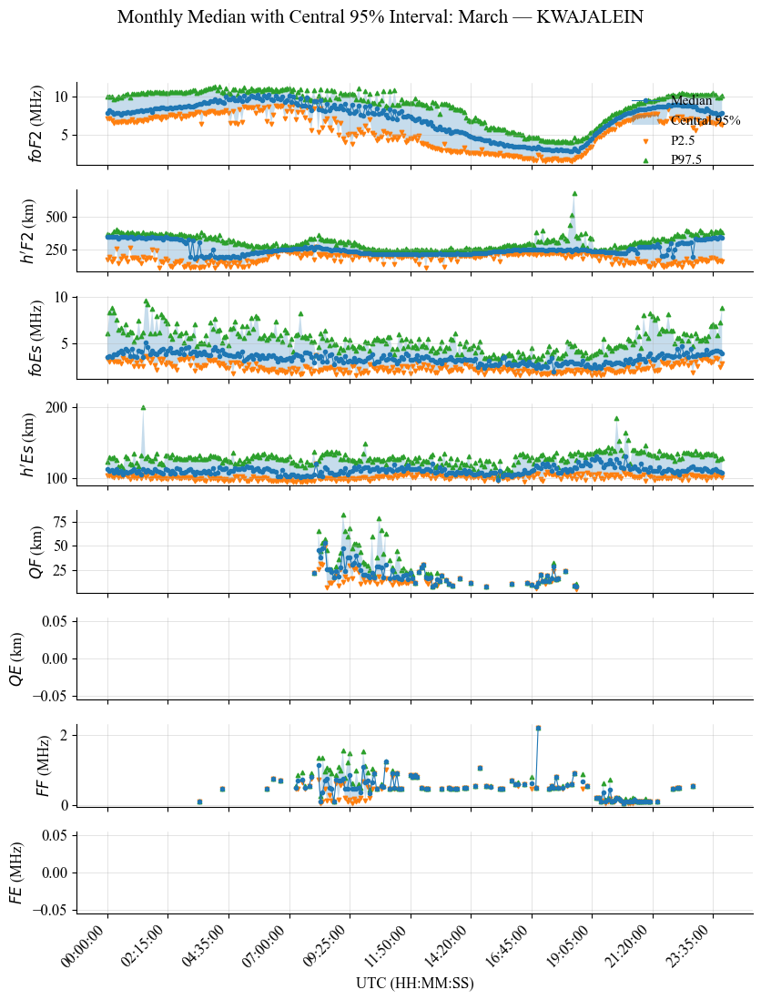

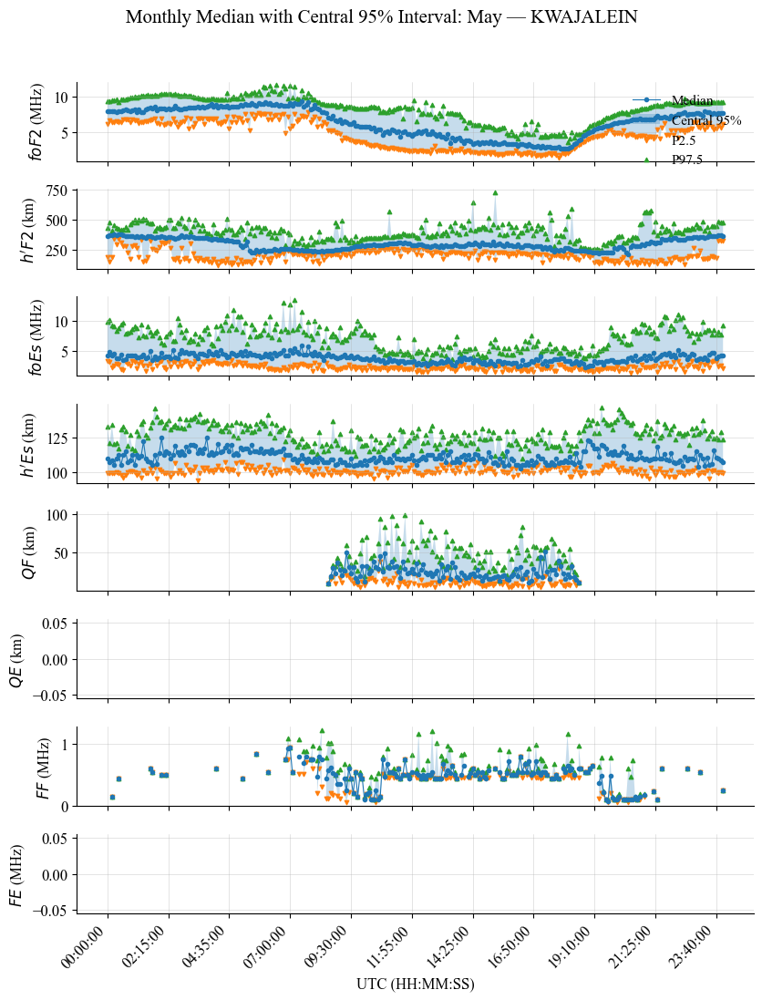

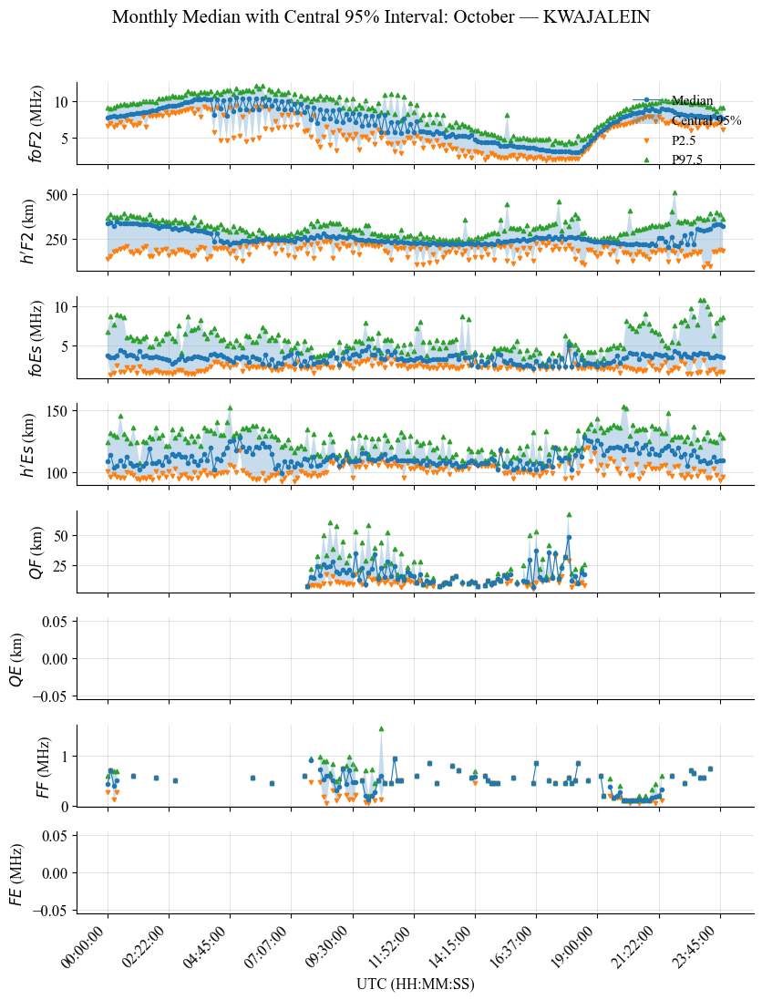

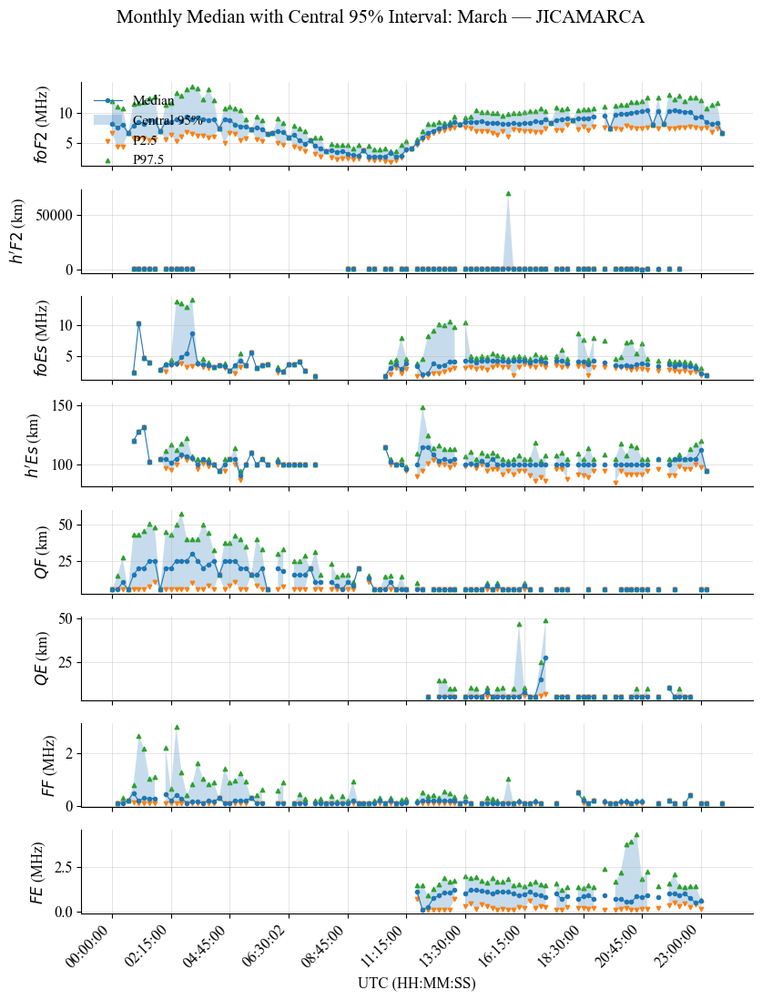

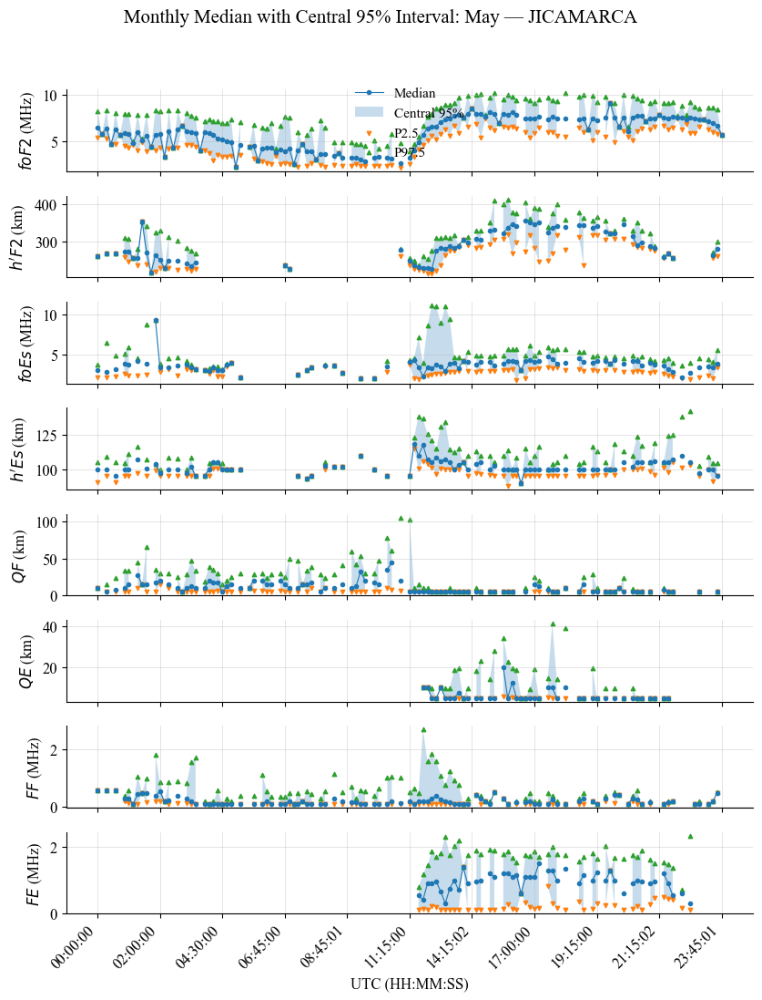

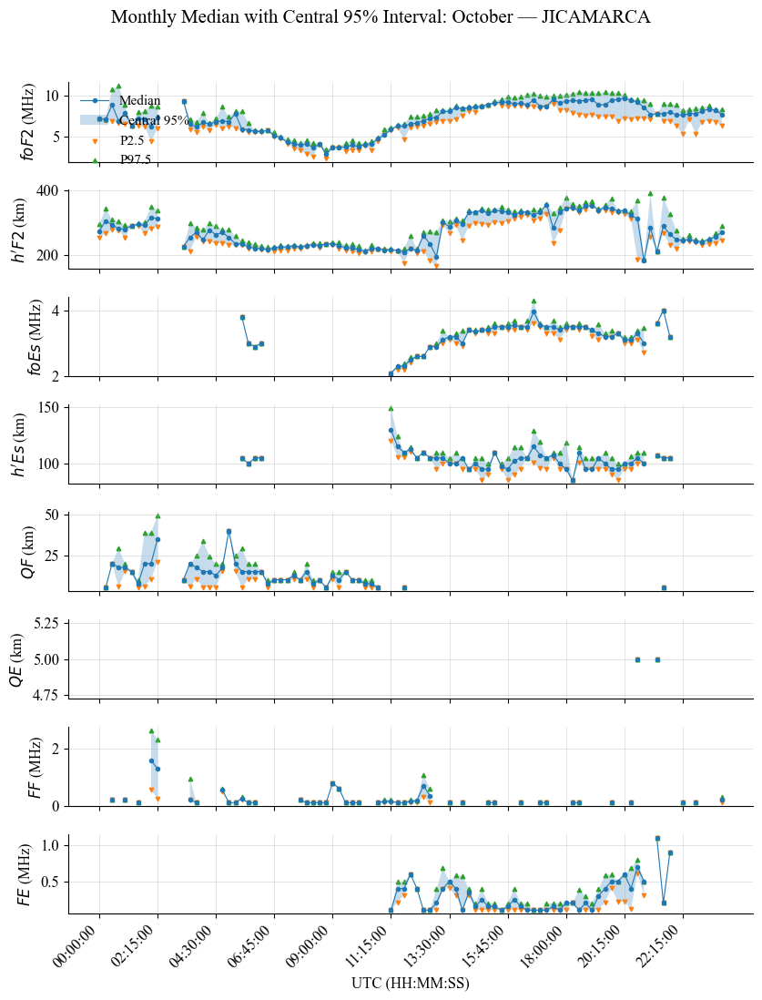

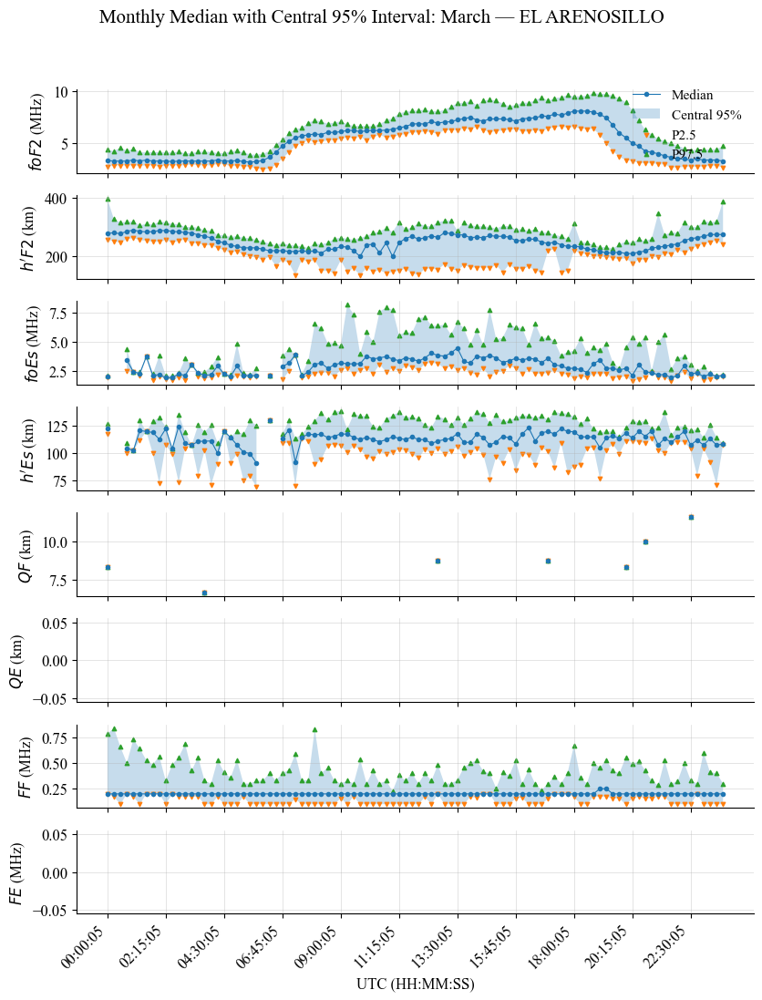

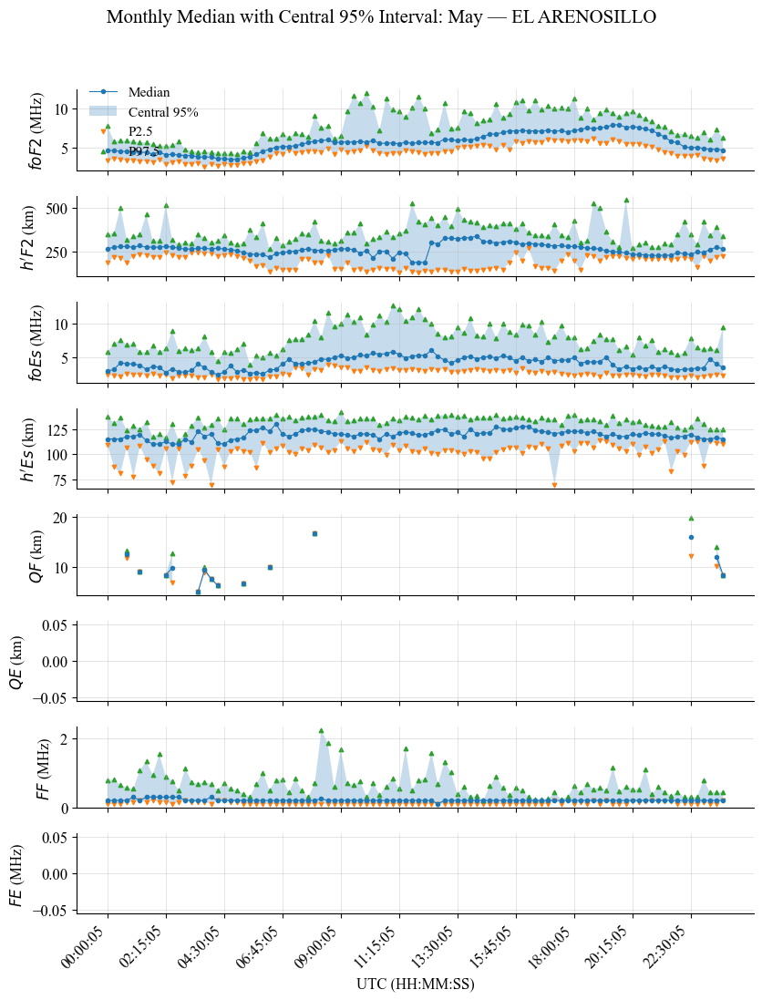

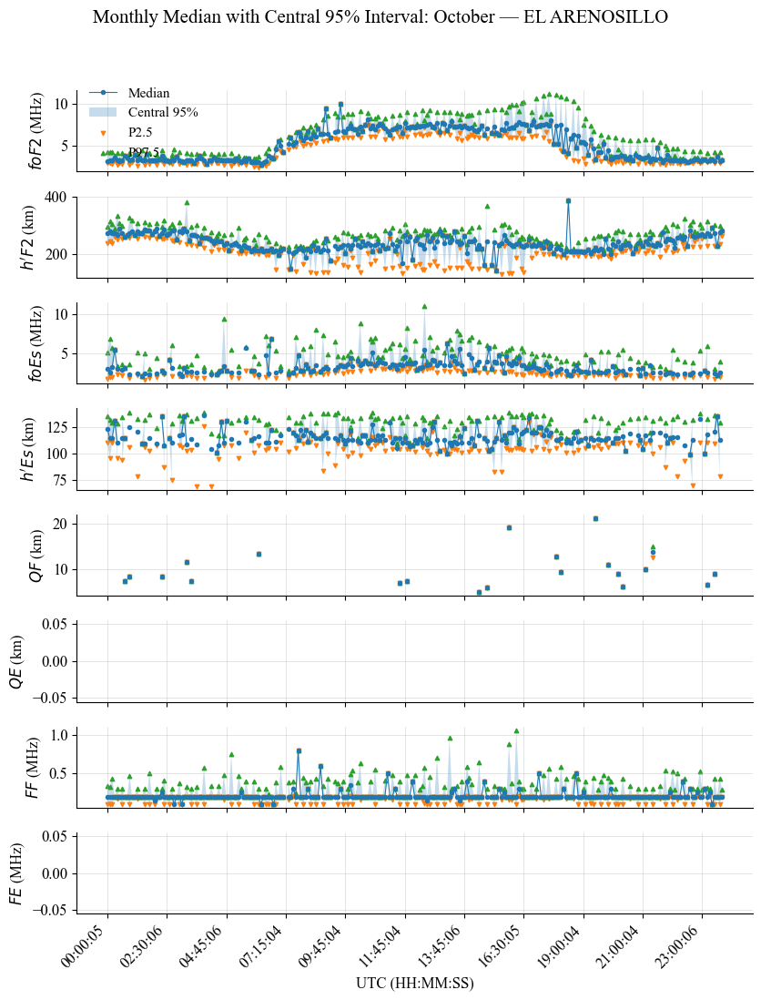

In [8]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman"],
    "font.size": 11,
    "axes.titlesize": 14,
    "figure.titlesize": 15,
    "axes.labelsize": 12,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "legend.fontsize": 11
})

columns_to_plot = [
    'scaled_foF2','scaled_hF2','scaled_foEs',
    'scaled_hEs','scaled_qf','scaled_qe','scaled_ff','scaled_fe'
]

Y_LABELS = {
    "scaled_foF2": r"$foF2$ (MHz)",
    "scaled_hF2":  r"$h'F2$ (km)",
    "scaled_foEs": r"$foEs$ (MHz)",
    "scaled_hEs":  r"$h'Es$ (km)",
    "scaled_qf":   r"$QF$ (km)",
    "scaled_qe":   r"$QE$ (km)",
    "scaled_ff":   r"$FF$ (MHz)",
    "scaled_fe":   r"$FE$ (MHz)",
}

def clean_name(col: str) -> str:
    return col.replace("scaled_", "")

# month_order = [
#     'January', 'February', 'March', 'April', 'May', 'June',
#     'July', 'August', 'September', 'October', 'November', 'December'
# ]
month_order = [
    'March','May', 'October'
]

LOW_Q = 0.025
HIGH_Q = 0.975

for station, file_path in digisonde_files.items():
    df = pd.read_pickle(file_path)

    df['sounding_timestamp'] = pd.to_datetime(df['sounding_timestamp'])

    # Important: use NaN, not 0.0
    df[columns_to_plot] = df[columns_to_plot].replace(9999.0, np.nan)

    df['month'] = df['sounding_timestamp'].dt.strftime('%B')
    df['time_only'] = df['sounding_timestamp'].dt.strftime('%H:%M:%S')

    unique_months = [m for m in month_order if m in df['month'].unique()]

    for month in unique_months:
        month_df = df[df['month'] == month].copy()

        median_df = (
            month_df.groupby('time_only')[columns_to_plot]
            .median()
            .reset_index()
            .sort_values('time_only')
        )

        low_df = (
            month_df.groupby('time_only')[columns_to_plot]
            .quantile(LOW_Q)
            .reset_index()
            .sort_values('time_only')
        )

        high_df = (
            month_df.groupby('time_only')[columns_to_plot]
            .quantile(HIGH_Q)
            .reset_index()
            .sort_values('time_only')
        )

        nrows = len(columns_to_plot)
        fig, axs = plt.subplots(nrows, 1, figsize=(8.5, 11), sharex=True)
        fig.suptitle(
            f"Monthly Median with Central 95% Interval: {month} — {station}",
            y=0.995
        )

        x = np.arange(len(median_df))
        time_labels = median_df['time_only'].values

        if len(time_labels) > 10:
            step = max(1, len(time_labels) // 10)
            selected_idx = np.arange(0, len(time_labels), step)
        else:
            selected_idx = np.arange(len(time_labels))

        for i, col in enumerate(columns_to_plot):
            ax = axs[i]

            y_med = median_df[col].to_numpy()
            y_low = low_df[col].to_numpy()
            y_high = high_df[col].to_numpy()

            ax.plot(
                x, y_med,
                marker='o',
                markersize=3,
                linewidth=0.8,
                label='Median'
            )

            ax.fill_between(
                x, y_low, y_high,
                alpha=0.25,
                label='Central 95%'
            )

            ax.scatter(x, y_low, s=10, marker='v', label='P2.5')
            ax.scatter(x, y_high, s=10, marker='^', label='P97.5')

            ax.set_ylabel(Y_LABELS.get(col, clean_name(col)))
            ax.grid(True, linewidth=0.4, alpha=0.6)
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)

            if i == 0:
                ax.legend(loc='best', frameon=False)

        axs[-1].set_xlabel("UTC (HH:MM:SS)")
        axs[-1].set_xticks(selected_idx)
        axs[-1].set_xticklabels(time_labels[selected_idx], rotation=45, ha='right')

        plt.tight_layout(rect=[0, 0, 1, 0.97])

        outpath = fr"C:\PROJECT-DEMETER\Paper1\Plots\NOA\{month}-median_{station}_new.png"
        plt.savefig(outpath, dpi=600, bbox_inches="tight")
        plt.show()

station Specific plot

In [9]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman"],
    "font.size": 11,
    "axes.titlesize": 14,
    "figure.titlesize": 15,
    "axes.labelsize": 12,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "legend.fontsize": 11
})

columns_to_plot = [
    'scaled_foF2', 'scaled_hF2', 'scaled_foEs',
    'scaled_hEs', 'scaled_qf', 'scaled_qe', 'scaled_ff', 'scaled_fe'
]

Y_LABELS = {
    "scaled_foF2": r"$foF2$ (MHz)",
    "scaled_hF2":  r"$h'F2$ (km)",
    "scaled_foEs": r"$foEs$ (MHz)",
    "scaled_hEs":  r"$h'Es$ (km)",
    "scaled_qf":   r"$QF$ (km)",
    "scaled_qe":   r"$QE$ (km)",
    "scaled_ff":   r"$FF$ (MHz)",
    "scaled_fe":   r"$FE$ (MHz)",
}

def clean_name(col: str) -> str:
    return col.replace("scaled_", "")

month_order = ['March', 'May', 'October', 'November']

# Q1-Q3 instead of central 95%
LOW_Q = 0.25
HIGH_Q = 0.75

# Event list
event_rows = [
    {"station": "EL ARENOSILLO", "timestamp": "2010-03-27 10:30:05", "To": 103.918},
    {"station": "JICAMARCA",     "timestamp": "2010-11-11 14:30:00", "To": 29.856},
    {"station": "KWAJALEIN",     "timestamp": "2010-03-02 22:35:00", "To": 60.636},
    {"station": "KWAJALEIN",     "timestamp": "2010-05-03 22:40:00", "To": 120.692},
    {"station": "KWAJALEIN",     "timestamp": "2010-10-22 22:22:00", "To": 0.613},
]

events_df = pd.DataFrame(event_rows)
events_df["timestamp"] = pd.to_datetime(events_df["timestamp"])
events_df["month"] = events_df["timestamp"].dt.strftime("%B")
events_df["time_only"] = events_df["timestamp"].dt.strftime("%H:%M:%S")


def time_to_seconds(tstr):
    """Convert HH:MM:SS string to seconds since midnight."""
    h, m, s = map(int, tstr.split(":"))
    return h * 3600 + m * 60 + s


for station, file_path in digisonde_files.items():
    df = pd.read_pickle(file_path)

    df['sounding_timestamp'] = pd.to_datetime(df['sounding_timestamp'])

    # Replace invalid values with NaN
    df[columns_to_plot] = df[columns_to_plot].replace(9999.0, 0)

    df['month'] = df['sounding_timestamp'].dt.strftime('%B')
    df['time_only'] = df['sounding_timestamp'].dt.strftime('%H:%M:%S')

    unique_months = [m for m in month_order if m in df['month'].unique()]

    # Events relevant to this station
    station_events = events_df[events_df["station"] == station].copy()

    for month in unique_months:
        month_df = df[df['month'] == month].copy()

        if month_df.empty:
            continue

        median_df = (
            month_df.groupby('time_only')[columns_to_plot]
            .median()
            .reset_index()
            .sort_values('time_only')
        )

        q1_df = (
            month_df.groupby('time_only')[columns_to_plot]
            .quantile(LOW_Q)
            .reset_index()
            .sort_values('time_only')
        )

        q3_df = (
            month_df.groupby('time_only')[columns_to_plot]
            .quantile(HIGH_Q)
            .reset_index()
            .sort_values('time_only')
        )

        nrows = len(columns_to_plot)
        fig, axs = plt.subplots(nrows, 1, figsize=(8.5, 11), sharex=True)
        fig.suptitle(
            f"Monthly Median: {month} — {station}",
            y=0.995
        )

        x = np.arange(len(median_df))
        time_labels = median_df['time_only'].values
        time_seconds = np.array([time_to_seconds(t) for t in time_labels])

        if len(time_labels) > 10:
            step = max(1, len(time_labels) // 10)
            selected_idx = np.arange(0, len(time_labels), step)
        else:
            selected_idx = np.arange(len(time_labels))

        # Events for this station and month
        month_events = station_events[station_events["month"] == month].copy()

        # Find nearest x-index for each event time
        coincident_points = []
        for _, ev in month_events.iterrows():
            ev_sec = time_to_seconds(ev["time_only"])
            idx_nearest = np.argmin(np.abs(time_seconds - ev_sec))
            coincident_points.append({
                "timestamp": ev["timestamp"],
                "time_only": ev["time_only"],
                "idx": idx_nearest,
                "To": ev["To"]
            })

        for i, col in enumerate(columns_to_plot):
            ax = axs[i]

            y_med = median_df[col].to_numpy()
            y_q1 = q1_df[col].to_numpy()
            y_q3 = q3_df[col].to_numpy()

            ax.plot(
                x, y_med,
                marker='o',
                markersize=3,
                linewidth=0.8,
                label='Median'
            )

            ax.fill_between(
                x, y_q1, y_q3,
                alpha=0.25,
                label='Q1–Q3'
            )

            ax.scatter(x, y_q1, s=7, marker='v', label='Q1')
            ax.scatter(x, y_q3, s=7, marker='^', label='Q3')

            # Mark coincident event points in dark red
            for cp in coincident_points:
                idx_cp = cp["idx"]
                y_cp = y_med[idx_cp]

                if np.isfinite(y_cp):
                    ax.scatter(
                        idx_cp, y_cp,
                        s=42,
                        color='darkred',
                        edgecolor='black',
                        linewidth=0.4,
                        zorder=5,
                        label='Coincident point' if i == 0 and cp == coincident_points[0] else None
                    )

                    ax.axvline(
                        idx_cp,
                        color='darkred',
                        linestyle='--',
                        linewidth=0.8,
                        alpha=0.7
                    )

            ax.set_ylabel(Y_LABELS.get(col, clean_name(col)))
            ax.grid(True, linewidth=0.4, alpha=0.6)
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)

            if i == 0:
                ax.legend(loc='best', frameon=False, fontsize=13)

        axs[-1].set_xlabel("UTC (HH:MM:SS)")
        axs[-1].set_xticks(selected_idx)
        axs[-1].set_xticklabels(time_labels[selected_idx], rotation=45, ha='right')

        plt.tight_layout(rect=[0, 0, 1, 0.97])

        outpath = fr"C:\PROJECT-DEMETER\Paper1\Plots\NOA\{month}-median_{station}_Q1Q3_coincident.png"
        plt.savefig(outpath, dpi=600, bbox_inches="tight")
        plt.show()

KeyboardInterrupt: 

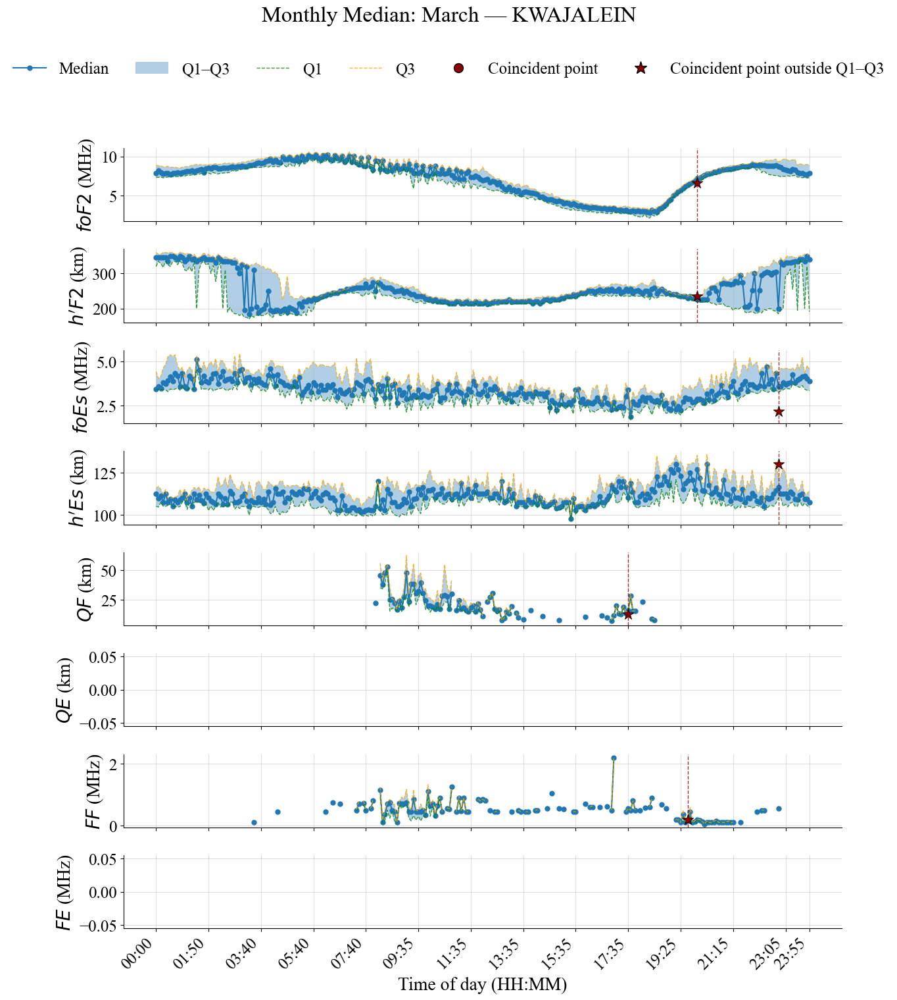

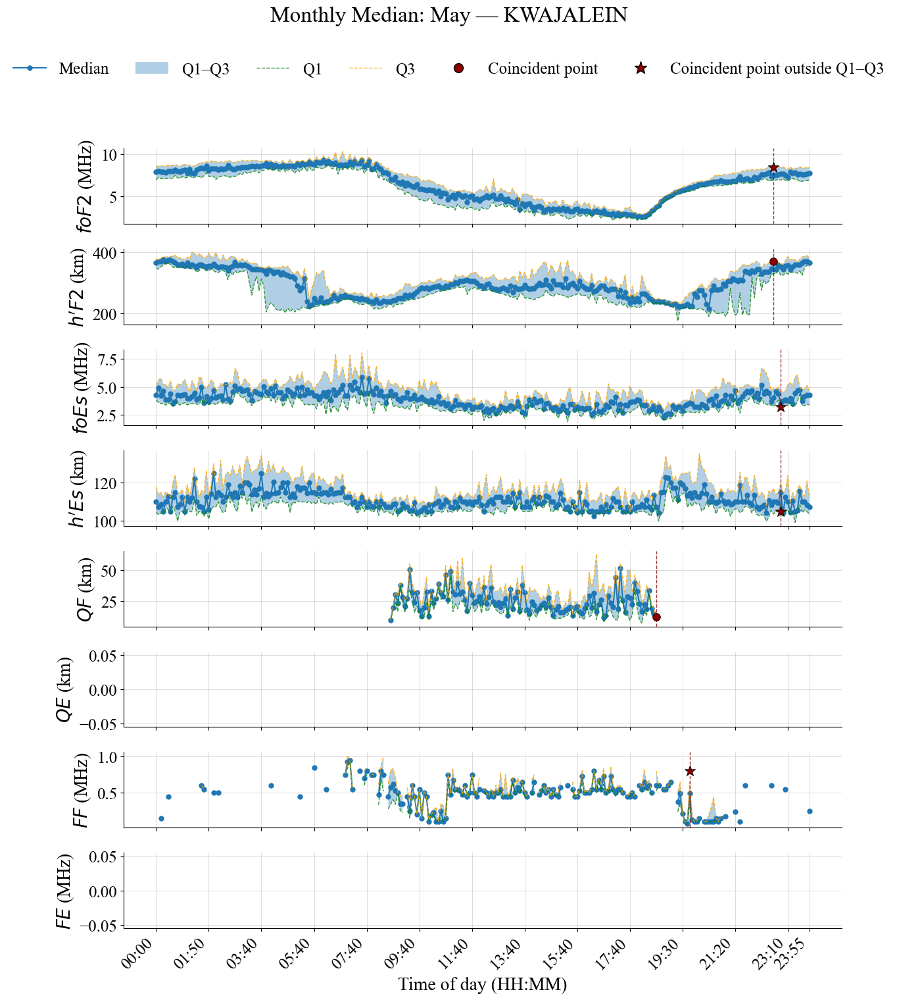

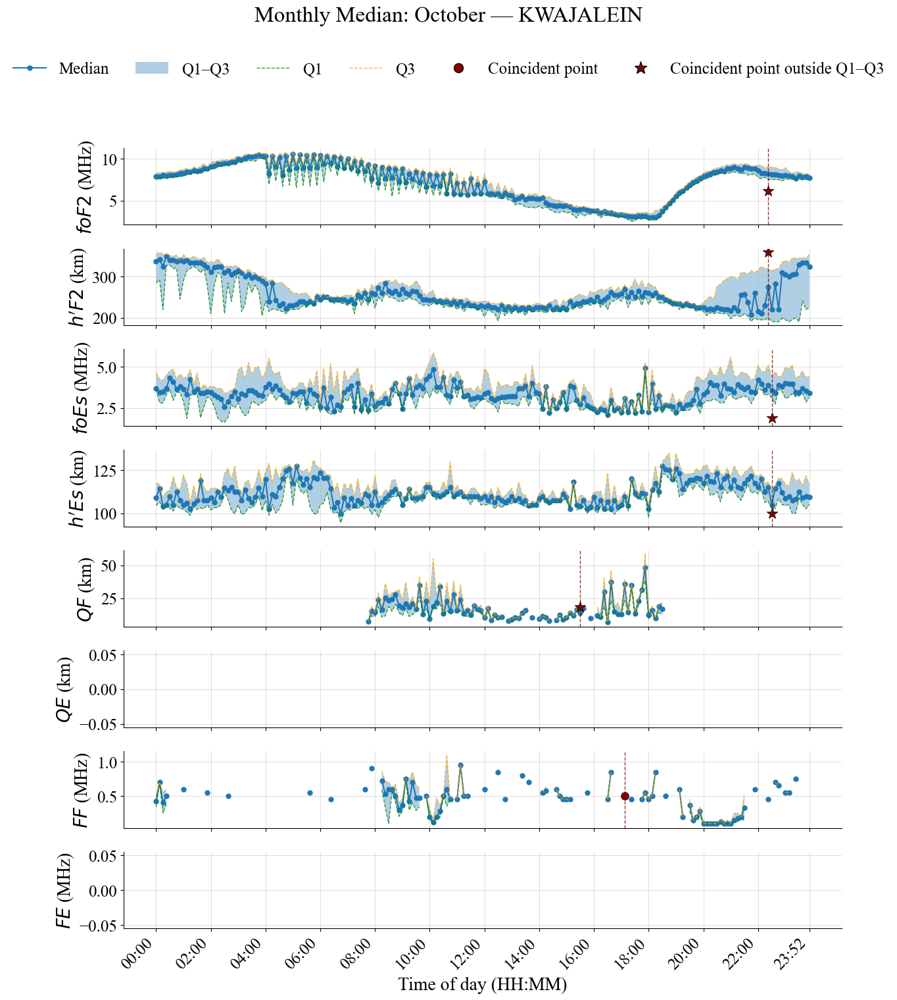

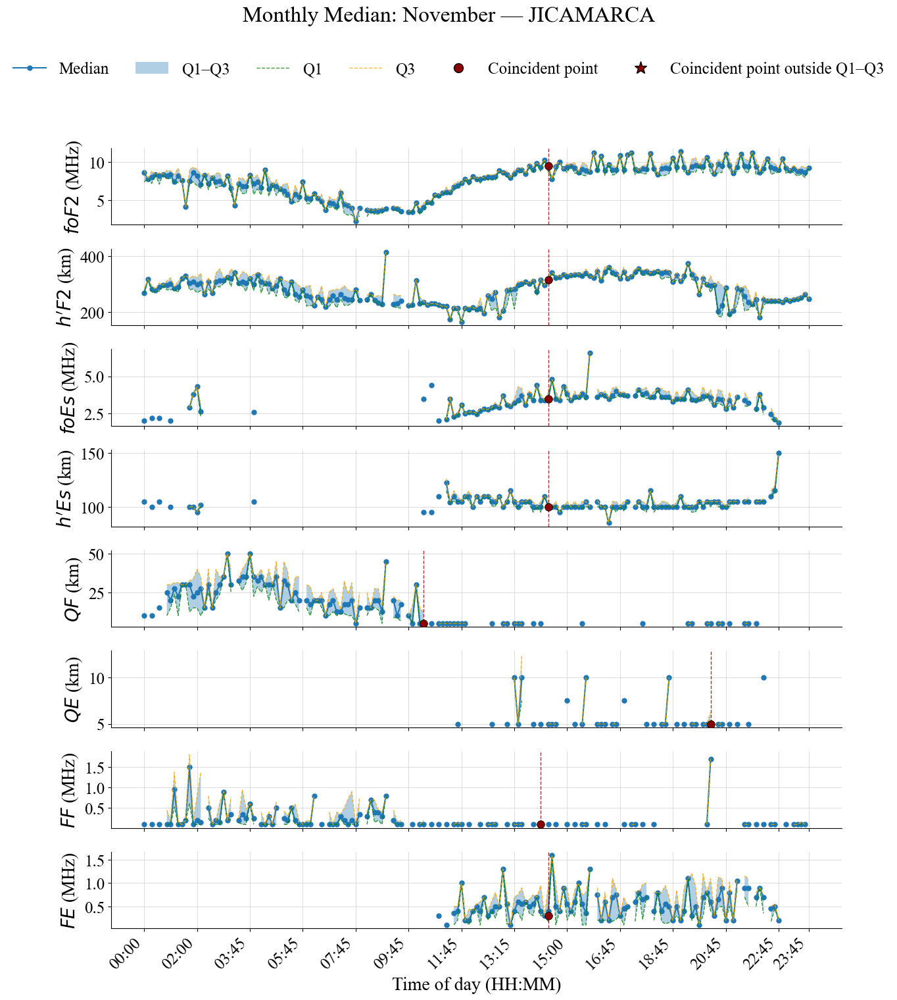

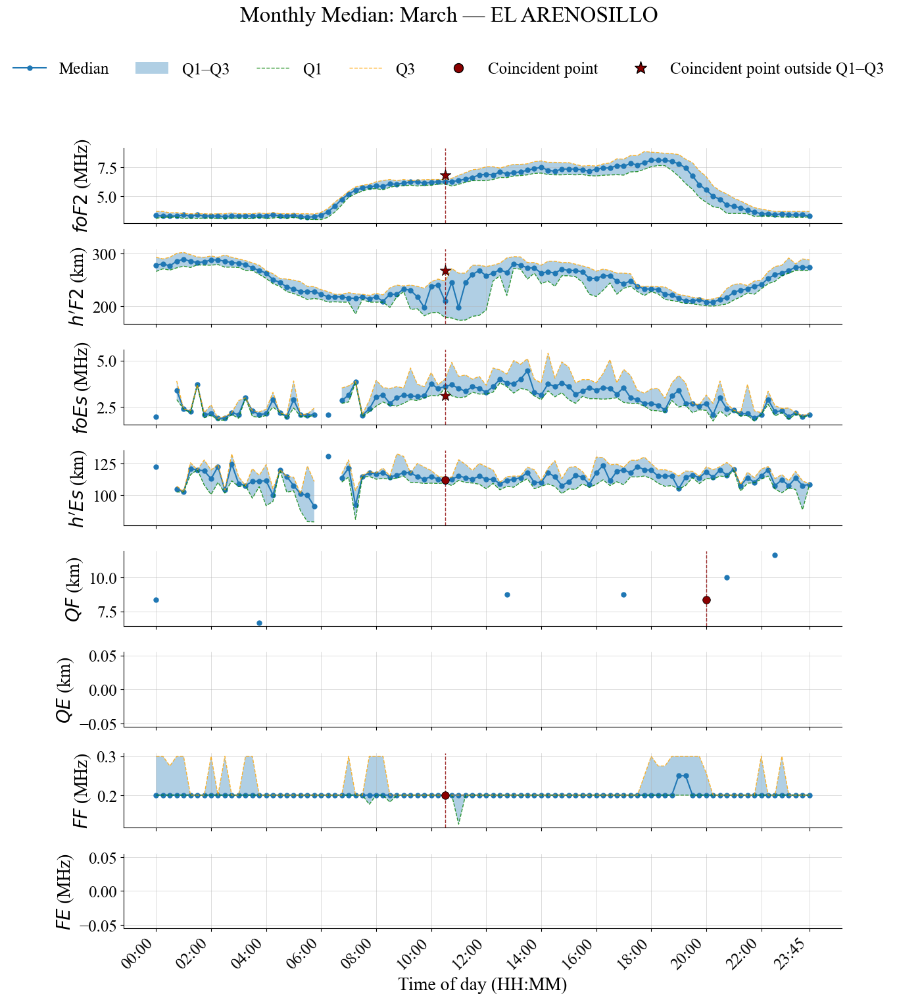

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

# =========================================================
# STYLE
# =========================================================
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman"],
    "font.size": 18,
    "axes.titlesize": 22,
    "figure.titlesize": 24,
    "axes.labelsize": 20,
    "xtick.labelsize": 18,
    "ytick.labelsize": 18,
    "legend.fontsize": 16
})

# =========================================================
# INPUTS
# =========================================================
columns_to_plot = [
    'scaled_foF2', 'scaled_hF2', 'scaled_foEs',
    'scaled_hEs', 'scaled_qf', 'scaled_qe', 'scaled_ff', 'scaled_fe'
]

Y_LABELS = {
    "scaled_foF2": r"$foF2$ (MHz)",
    "scaled_hF2":  r"$h'F2$ (km)",
    "scaled_foEs": r"$foEs$ (MHz)",
    "scaled_hEs":  r"$h'Es$ (km)",
    "scaled_qf":   r"$QF$ (km)",
    "scaled_qe":   r"$QE$ (km)",
    "scaled_ff":   r"$FF$ (MHz)",
    "scaled_fe":   r"$FE$ (MHz)",
}

month_order = ['March', 'May', 'October', 'November']
LOW_Q = 0.25
HIGH_Q = 0.75

event_rows = [
    {"station": "EL ARENOSILLO", "timestamp": "2010-03-27 10:30:05", "To": 103.918},
    {"station": "JICAMARCA",     "timestamp": "2010-11-11 14:30:00", "To": 29.856},
    {"station": "KWAJALEIN",     "timestamp": "2010-03-02 22:35:00", "To": 60.636},
    {"station": "KWAJALEIN",     "timestamp": "2010-05-03 22:40:00", "To": 120.692},
    {"station": "KWAJALEIN",     "timestamp": "2010-10-22 22:22:00", "To": 0.613},
]

events_df = pd.DataFrame(event_rows)
events_df["timestamp"] = pd.to_datetime(events_df["timestamp"])
events_df["month"] = events_df["timestamp"].dt.strftime("%B")
events_df["time_only"] = events_df["timestamp"].dt.strftime("%H:%M:%S")

# =========================================================
# HELPERS
# =========================================================
def clean_name(col: str) -> str:
    return col.replace("scaled_", "")

def time_to_seconds(tstr: str) -> int:
    h, m, s = map(int, tstr.split(":"))
    return h * 3600 + m * 60 + s

def get_nearest_observation(month_df: pd.DataFrame, event_time: pd.Timestamp, col: str):
    """
    Return nearest REAL observation row for the given parameter.
    Uses actual sounding timestamps, not climatological median.
    """
    temp = month_df[["sounding_timestamp", "time_only", col]].dropna().copy()
    if temp.empty:
        return None

    idx = np.argmin(
        np.abs((temp["sounding_timestamp"] - event_time).dt.total_seconds().to_numpy())
    )
    return temp.iloc[idx]

# =========================================================
# MAIN
# =========================================================
for station, file_path in digisonde_files.items():
    df = pd.read_pickle(file_path).copy()

    df["sounding_timestamp"] = pd.to_datetime(df["sounding_timestamp"])

    # Correct invalid values
    # 9999.0 is invalid -> NaN
    # 0.9999 is forced to 0 only if you want continuity
    df[columns_to_plot] = df[columns_to_plot].replace(9999.0, np.nan)
    df[columns_to_plot] = df[columns_to_plot].replace(0.9999, 0)

    df["month"] = df["sounding_timestamp"].dt.strftime("%B")
    df["time_only"] = df["sounding_timestamp"].dt.strftime("%H:%M:%S")

    station_events = events_df[events_df["station"] == station].copy()
    if station_events.empty:
        continue

    # Only plot months that actually have coincident events for this station
    unique_months = [m for m in month_order if m in station_events["month"].unique()]

    for month in unique_months:
        month_df = df[df["month"] == month].copy()
        if month_df.empty:
            continue

        month_events = station_events[station_events["month"] == month].copy()
        if month_events.empty:
            continue

        median_df = (
            month_df.groupby("time_only")[columns_to_plot]
            .median()
            .reset_index()
            .sort_values("time_only")
        )

        q1_df = (
            month_df.groupby("time_only")[columns_to_plot]
            .quantile(LOW_Q)
            .reset_index()
            .sort_values("time_only")
        )

        q3_df = (
            month_df.groupby("time_only")[columns_to_plot]
            .quantile(HIGH_Q)
            .reset_index()
            .sort_values("time_only")
        )

        nrows = len(columns_to_plot)
        fig, axs = plt.subplots(nrows, 1, figsize=(12.5, 15.5), sharex=True)

        fig.suptitle(
            f"Monthly Median: {month} — {station}",
            y=0.985,
            fontsize=24
        )

        x = np.arange(len(median_df))
        time_labels_full = median_df["time_only"].values
        time_labels_hhmm = pd.to_datetime(
            median_df["time_only"], format="%H:%M:%S"
        ).dt.strftime("%H:%M")

        if len(time_labels_full) > 12:
            step = max(1, len(time_labels_full) // 12)
            selected_idx = np.arange(0, len(time_labels_full), step)
            if selected_idx[-1] != len(time_labels_full) - 1:
                selected_idx = np.append(selected_idx, len(time_labels_full) - 1)
        else:
            selected_idx = np.arange(len(time_labels_full))

        time_to_x = {t: i for i, t in enumerate(time_labels_full)}

        legend_handles = None

        for i, col in enumerate(columns_to_plot):
            ax = axs[i]

            y_med = median_df[col].to_numpy()
            y_q1 = q1_df[col].to_numpy()
            y_q3 = q3_df[col].to_numpy()

            median_line, = ax.plot(
                x, y_med,
                marker="o",
                markersize=5,
                linewidth=1.5,
                label="Median"
            )

            qband = ax.fill_between(
                x, y_q1, y_q3,
                alpha=0.35,
                label="Q1–Q3"
            )

            q1_line, = ax.plot(
                x, y_q1,
                linewidth=1.0,
                linestyle="--",
                alpha=0.8,
                color="green",
                label="Q1"
            )

            q3_line, = ax.plot(
                x, y_q3,
                linewidth=1.0,
                linestyle="--",
                alpha=0.8,
                color="orange",
                label="Q3"
            )

            for _, ev in month_events.iterrows():
                nearest_obs = get_nearest_observation(month_df, ev["timestamp"], col)

                if nearest_obs is None:
                    continue

                time_key = nearest_obs["time_only"]
                if time_key not in time_to_x:
                    continue

                idx_cp = time_to_x[time_key]
                y_cp = nearest_obs[col]

                if not np.isfinite(y_cp):
                    continue

                cp_q1 = y_q1[idx_cp]
                cp_q3 = y_q3[idx_cp]

                if np.isfinite(cp_q1) and np.isfinite(cp_q3) and ((y_cp < cp_q1) or (y_cp > cp_q3)):
                    cp_marker = "*"
                    cp_size = 155
                else:
                    cp_marker = "o"
                    cp_size = 70

                ax.scatter(
                    idx_cp, y_cp,
                    s=cp_size,
                    color="darkred",
                    edgecolor="black",
                    linewidth=0.6,
                    marker=cp_marker,
                    zorder=6
                )

                ax.axvline(
                    idx_cp,
                    color="darkred",
                    linestyle="--",
                    linewidth=1.0,
                    alpha=0.8
                )

            ax.set_ylabel(Y_LABELS.get(col, clean_name(col)), fontsize=20)
            ax.grid(True, linewidth=0.5, alpha=0.6)
            ax.spines["top"].set_visible(False)
            ax.spines["right"].set_visible(False)
            ax.tick_params(axis="both", which="major", labelsize=18)

            if i == 0:
                qband_handle = Patch(alpha=0.35, label="Q1–Q3")

                coincident_handle = Line2D(
                    [0], [0],
                    marker="o",
                    color="darkred",
                    markerfacecolor="darkred",
                    markeredgecolor="black",
                    markersize=10,
                    linewidth=0,
                    label="Coincident point"
                )

                coincident_outside_handle = Line2D(
                    [0], [0],
                    marker="*",
                    color="darkred",
                    markerfacecolor="darkred",
                    markeredgecolor="black",
                    markersize=14,
                    linewidth=0,
                    label="Coincident point outside Q1–Q3"
                )

                legend_handles = [
                    median_line,
                    qband_handle,
                    q1_line,
                    q3_line,
                    coincident_handle,
                    coincident_outside_handle
                ]

        fig.legend(
            handles=legend_handles,
            loc="upper center",
            bbox_to_anchor=(0.5, 0.945),
            ncol=6,
            frameon=False,
            fontsize=18,
            columnspacing=1.6,
            handletextpad=0.8
        )

        axs[-1].set_xlabel("Time of day (HH:MM)", fontsize=20)
        axs[-1].set_xticks(selected_idx)
        axs[-1].set_xticklabels(
            time_labels_hhmm[selected_idx],
            rotation=45,
            ha="right",
            fontsize=18
        )

        plt.tight_layout(rect=[0, 0, 1, 0.90])

        outpath = fr"C:\PROJECT-DEMETER\Paper1\Plots\NOA\{month}-median_{station}_Q1Q3_coincident_real.png"
        plt.savefig(outpath, dpi=600, bbox_inches="tight")
        plt.show()

Satistics-+12 hours


Processing station: KWAJALEIN


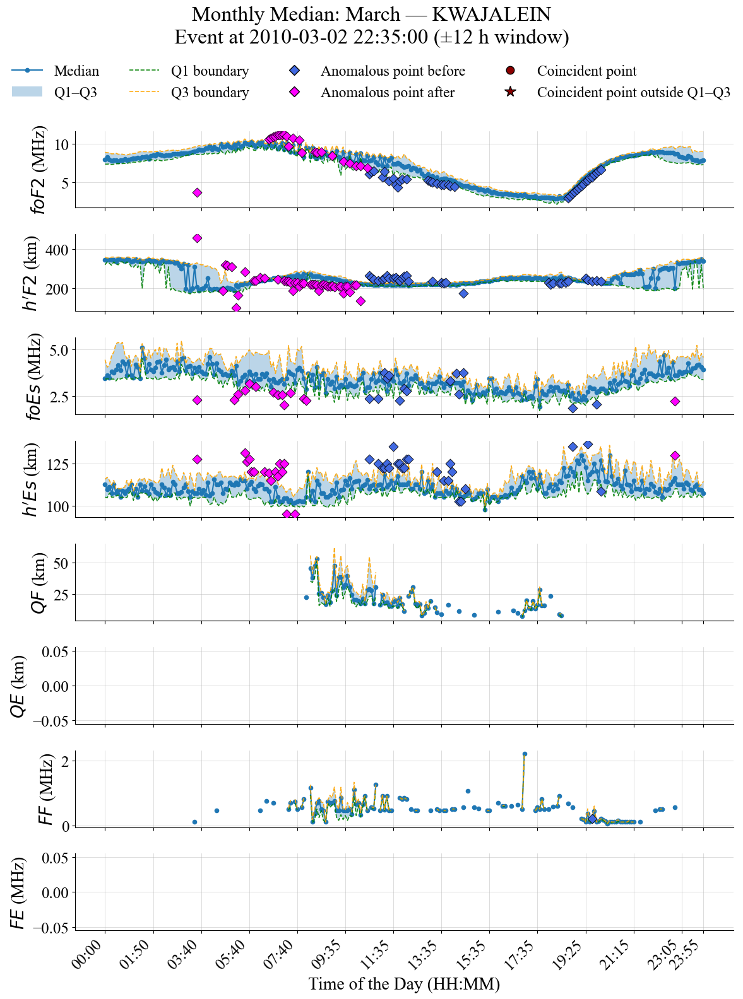

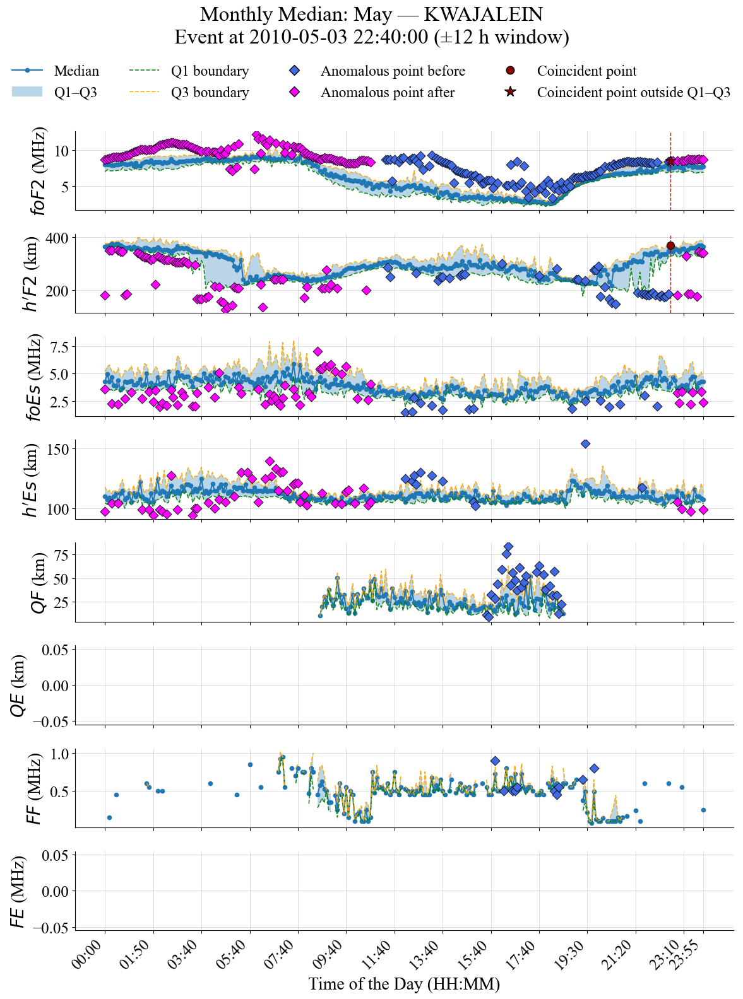

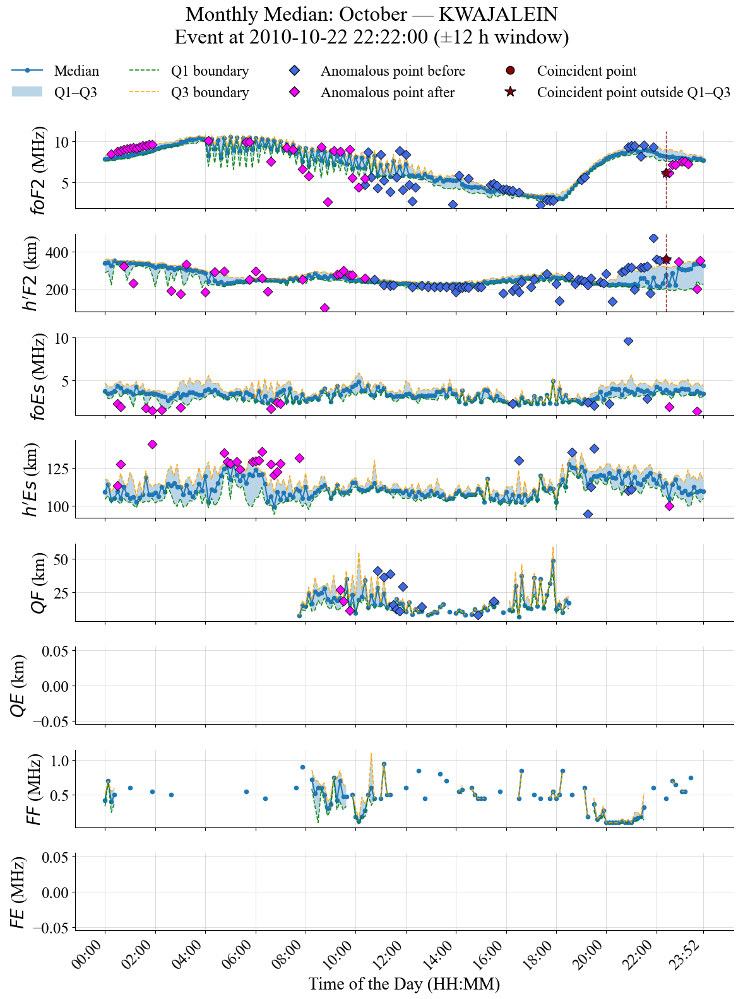


Processing station: JICAMARCA


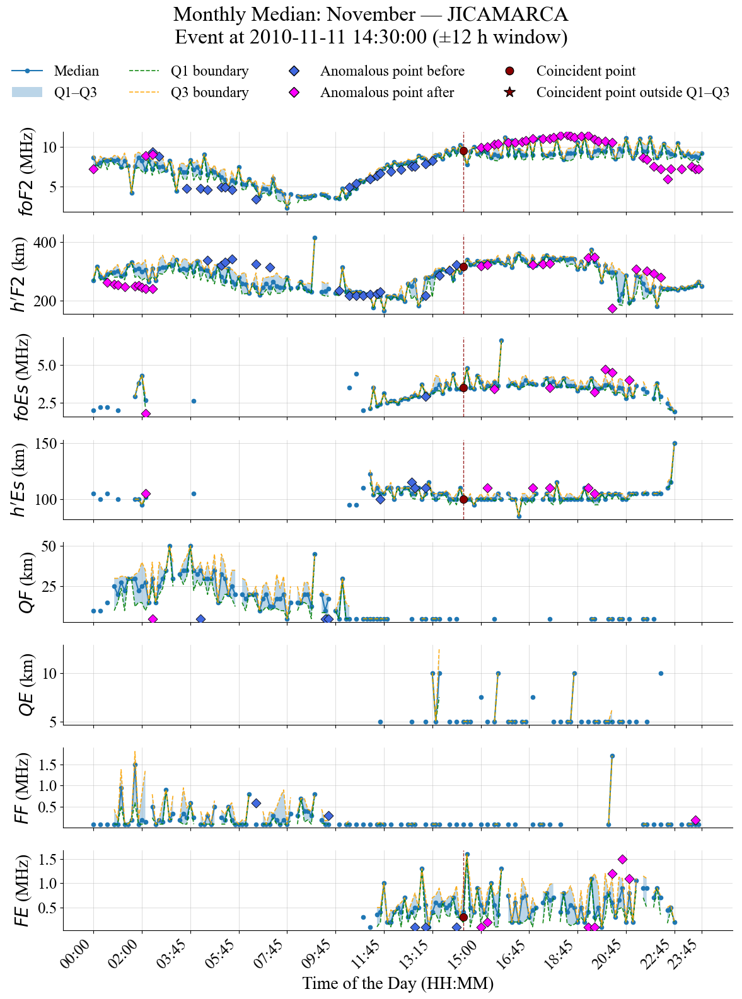


Processing station: EL ARENOSILLO


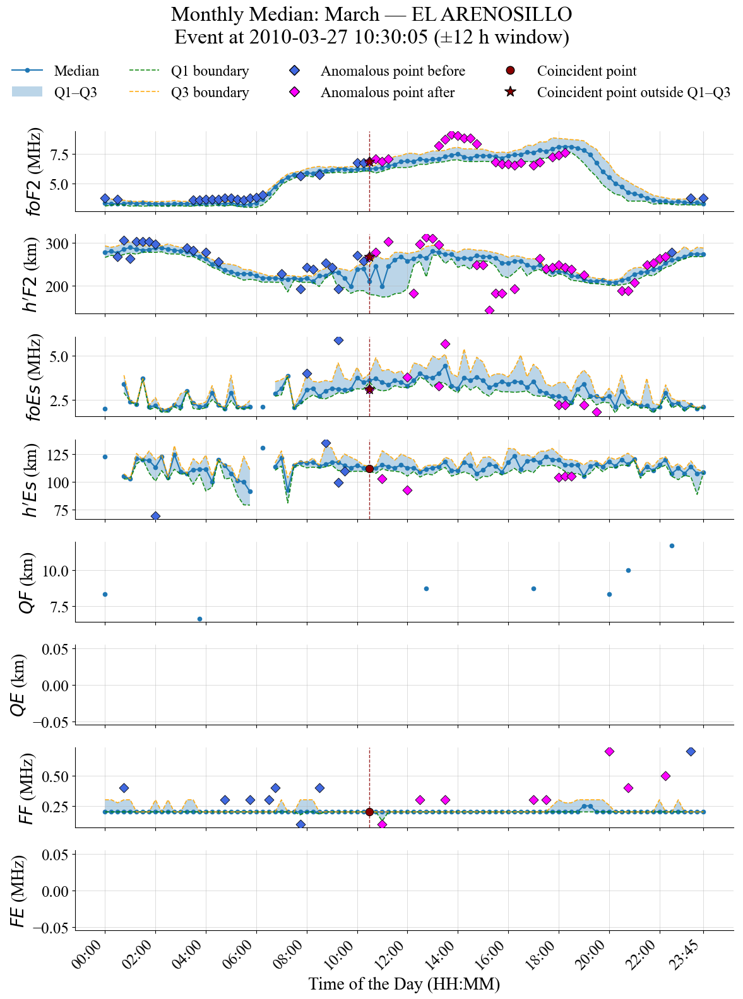


Done.
Plots saved in: C:\PROJECT-DEMETER\Paper1\Plots\NOA
CSVs saved in:  C:\PROJECT-DEMETER\Paper1\Plots\NOA\coincident_csv


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from pathlib import Path
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

# =========================================================
# STYLE
# =========================================================
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman"],
    "font.size": 18,
    "axes.titlesize": 22,
    "figure.titlesize": 24,
    "axes.labelsize": 20,
    "xtick.labelsize": 18,
    "ytick.labelsize": 18,
    "legend.fontsize": 15
})

# =========================================================
# INPUTS
# =========================================================
columns_to_plot = [
    'scaled_foF2', 'scaled_hF2', 'scaled_foEs',
    'scaled_hEs', 'scaled_qf', 'scaled_qe', 'scaled_ff', 'scaled_fe'
]

Y_LABELS = {
    "scaled_foF2": r"$foF2$ (MHz)",
    "scaled_hF2":  r"$h'F2$ (km)",
    "scaled_foEs": r"$foEs$ (MHz)",
    "scaled_hEs":  r"$h'Es$ (km)",
    "scaled_qf":   r"$QF$ (km)",
    "scaled_qe":   r"$QE$ (km)",
    "scaled_ff":   r"$FF$ (MHz)",
    "scaled_fe":   r"$FE$ (MHz)",
}

month_order = ['March', 'May', 'October', 'November']
LOW_Q = 0.25
HIGH_Q = 0.75
WINDOW_HOURS = 12

event_rows = [
    {"station": "EL ARENOSILLO", "timestamp": "2010-03-27 10:30:05", "To": 103.918},
    {"station": "JICAMARCA",     "timestamp": "2010-11-11 14:30:00", "To": 29.856},
    {"station": "KWAJALEIN",     "timestamp": "2010-03-02 22:35:00", "To": 60.636},
    {"station": "KWAJALEIN",     "timestamp": "2010-05-03 22:40:00", "To": 120.692},
    {"station": "KWAJALEIN",     "timestamp": "2010-10-22 22:22:00", "To": 0.613},
]

PLOT_DIR = Path(r"C:\PROJECT-DEMETER\Paper1\Plots\NOA")
CSV_DIR = Path(r"C:\PROJECT-DEMETER\Paper1\Plots\NOA\coincident_csv")
PLOT_DIR.mkdir(parents=True, exist_ok=True)
CSV_DIR.mkdir(parents=True, exist_ok=True)

events_df = pd.DataFrame(event_rows)
events_df["timestamp"] = pd.to_datetime(events_df["timestamp"])
events_df["month"] = events_df["timestamp"].dt.strftime("%B")
events_df["time_only"] = events_df["timestamp"].dt.strftime("%H:%M:%S")

# =========================================================
# HELPERS
# =========================================================
def clean_name(col: str) -> str:
    return col.replace("scaled_", "")

def sanitize_filename(text: str) -> str:
    bad = ['\\', '/', ':', '*', '?', '"', '<', '>', '|']
    for ch in bad:
        text = text.replace(ch, "_")
    return text.replace(" ", "_")

def get_exact_event_rows(df_in: pd.DataFrame, event_time: pd.Timestamp) -> pd.DataFrame:
    """
    Return rows exactly at the event timestamp.
    No nearest matching is used.
    """
    return df_in[df_in["sounding_timestamp"] == event_time].copy()

# =========================================================
# MAIN
# =========================================================
all_flagged_records = []
all_summary_records = []

for station, file_path in digisonde_files.items():
    print(f"\nProcessing station: {station}")

    # -----------------------------------------------------
    # READ DATA
    # -----------------------------------------------------
    df = pd.read_pickle(file_path).copy()
    df["sounding_timestamp"] = pd.to_datetime(df["sounding_timestamp"])

    # Preserve original values
    for col in columns_to_plot:
        df[f"{col}_raw"] = df[col]

    # Requested cleaning
    # 9999.0 = invalid -> NaN
    # 0.9999 = set to 0 for continuity
    df[columns_to_plot] = df[columns_to_plot].replace(9999.0, np.nan)
    df[columns_to_plot] = df[columns_to_plot].replace(0.9999, np.nan)

    df["month"] = df["sounding_timestamp"].dt.strftime("%B")
    df["time_only"] = df["sounding_timestamp"].dt.strftime("%H:%M:%S")

    station_events = events_df[events_df["station"] == station].copy()
    if station_events.empty:
        continue

    event_months = [m for m in month_order if m in station_events["month"].unique()]

    monthly_climatology = {}

    for month in event_months:
        month_df = df[df["month"] == month].copy()
        if month_df.empty:
            continue

        median_df = (
            month_df.groupby("time_only")[columns_to_plot]
            .median()
            .reset_index()
            .sort_values("time_only")
        )

        q1_df = (
            month_df.groupby("time_only")[columns_to_plot]
            .quantile(LOW_Q)
            .reset_index()
            .sort_values("time_only")
        )

        q3_df = (
            month_df.groupby("time_only")[columns_to_plot]
            .quantile(HIGH_Q)
            .reset_index()
            .sort_values("time_only")
        )

        monthly_climatology[month] = {
            "month_df": month_df,
            "median_df": median_df,
            "q1_df": q1_df,
            "q3_df": q3_df
        }

    # -----------------------------------------------------
    # EVENT LOOP
    # -----------------------------------------------------
    for _, ev in station_events.iterrows():
        event_time = ev["timestamp"]
        month = ev["month"]
        event_to = ev["To"]

        if month not in monthly_climatology:
            continue

        month_df = monthly_climatology[month]["month_df"]
        median_df = monthly_climatology[month]["median_df"]
        q1_df = monthly_climatology[month]["q1_df"]
        q3_df = monthly_climatology[month]["q3_df"]

        # ±12 h window for anomaly search
        win_start = event_time - pd.Timedelta(hours=WINDOW_HOURS)
        win_end = event_time + pd.Timedelta(hours=WINDOW_HOURS)

        window_df = df[
            (df["sounding_timestamp"] >= win_start) &
            (df["sounding_timestamp"] <= win_end)
        ].copy()

        if window_df.empty:
            continue

        # EXACT event rows only
        exact_event_rows = get_exact_event_rows(month_df, event_time)
        exact_time_exists = not exact_event_rows.empty

        x = np.arange(len(median_df))
        time_labels_full = median_df["time_only"].values
        time_labels_hhmm = pd.to_datetime(
            median_df["time_only"], format="%H:%M:%S"
        ).dt.strftime("%H:%M")
        time_to_x = {t: i for i, t in enumerate(time_labels_full)}

        if len(time_labels_full) > 12:
            step = max(1, len(time_labels_full) // 12)
            selected_idx = np.arange(0, len(time_labels_full), step)
            if selected_idx[-1] != len(time_labels_full) - 1:
                selected_idx = np.append(selected_idx, len(time_labels_full) - 1)
        else:
            selected_idx = np.arange(len(time_labels_full))

        # -------------------------------------------------
        # BUILD DETAILED RECORDS
        # -------------------------------------------------
        detailed_records_this_event = []

        for col in columns_to_plot:
            q1_map = q1_df.set_index("time_only")[col].to_dict()
            q3_map = q3_df.set_index("time_only")[col].to_dict()
            raw_col = f"{col}_raw"

            for _, obs_row in window_df.iterrows():
                obs_time = obs_row["sounding_timestamp"]
                time_key = obs_row["time_only"]

                raw_val = obs_row[raw_col]
                obs_val = obs_row[col]

                # Keep invalid values excluded from statistics
                if pd.isna(raw_val) or raw_val == 9999.0:
                    continue
                if pd.isna(obs_val):
                    continue

                q1_val = q1_map.get(time_key, np.nan)
                q3_val = q3_map.get(time_key, np.nan)

                if pd.isna(q1_val) or pd.isna(q3_val):
                    continue

                if obs_val < q1_val:
                    side = "below_q1"
                    deviation = q1_val - obs_val
                elif obs_val > q3_val:
                    side = "above_q3"
                    deviation = obs_val - q3_val
                else:
                    continue

                relative_position = "before_event" if obs_time < event_time else "after_event"

                detailed_records_this_event.append({
                    "station": station,
                    "event_timestamp": event_time,
                    "event_month": month,
                    "To": event_to,
                    "window_start": win_start,
                    "window_end": win_end,
                    "observation_timestamp": obs_time,
                    "hours_from_event": (obs_time - event_time).total_seconds() / 3600.0,
                    "relative_position": relative_position,
                    "feature": col,
                    "feature_clean": clean_name(col),
                    "observed_value": obs_val,
                    "q1": q1_val,
                    "q3": q3_val,
                    "deviation_from_band": deviation,
                    "side": side
                })

        flagged_df = pd.DataFrame(detailed_records_this_event)

        event_tag = sanitize_filename(f"{station}_{event_time.strftime('%Y-%m-%d_%H-%M-%S')}")
        detailed_csv_path = CSV_DIR / f"{event_tag}_flagged_points.csv"

        if not flagged_df.empty:
            flagged_df = flagged_df.sort_values(["feature", "observation_timestamp"]).reset_index(drop=True)
            flagged_df.to_csv(detailed_csv_path, index=False)
            all_flagged_records.append(flagged_df)

            summary_df = (
                flagged_df.groupby(
                    ["station", "event_timestamp", "event_month", "feature", "feature_clean", "side", "relative_position"]
                )
                .agg(
                    n_flagged_points=("deviation_from_band", "size"),
                    min_deviation=("deviation_from_band", "min"),
                    median_deviation=("deviation_from_band", "median"),
                    mean_deviation=("deviation_from_band", "mean"),
                    max_deviation=("deviation_from_band", "max")
                )
                .reset_index()
            )
            summary_df["To"] = event_to
            all_summary_records.append(summary_df)
        else:
            pd.DataFrame(columns=[
                "station", "event_timestamp", "event_month", "To", "window_start", "window_end",
                "observation_timestamp", "hours_from_event", "relative_position",
                "feature", "feature_clean", "observed_value", "q1", "q3",
                "deviation_from_band", "side"
            ]).to_csv(detailed_csv_path, index=False)

        # -------------------------------------------------
        # PLOT
        # -------------------------------------------------
        nrows = len(columns_to_plot)
        fig, axs = plt.subplots(nrows, 1, figsize=(12, 16), sharex=True)

        fig.suptitle(
            f"Monthly Median: {month} — {station}\nEvent at {event_time.strftime('%Y-%m-%d %H:%M:%S')} (±12 h window)",
            y=0.995,
            fontsize=24
        )

        legend_handles = None

        # exact event x-position, only if exact timestamp exists in climatology time axis
        exact_idx_cp = None
        event_time_key = event_time.strftime("%H:%M:%S")
        if exact_time_exists and event_time_key in time_to_x:
            exact_idx_cp = time_to_x[event_time_key]

        for i, col in enumerate(columns_to_plot):
            ax = axs[i]

            y_med = median_df[col].to_numpy()
            y_q1 = q1_df[col].to_numpy()
            y_q3 = q3_df[col].to_numpy()

            median_line, = ax.plot(
                x, y_med,
                marker='o',
                markersize=4.5,
                linewidth=1.5,
                label='Median'
            )

            qband = ax.fill_between(
                x, y_q1, y_q3,
                alpha=0.30,
                label='Q1–Q3'
            )

            q1_line, = ax.plot(
                x, y_q1,
                linewidth=1.2,
                linestyle='--',
                alpha=0.9,
                color='green',
                label='Q1 boundary'
            )

            q3_line, = ax.plot(
                x, y_q3,
                linewidth=1.2,
                linestyle='--',
                alpha=0.9,
                color='orange',
                label='Q3 boundary'
            )

            # anomalous points in ±12 h window
            feature_flagged = flagged_df[flagged_df["feature"] == col] if not flagged_df.empty else pd.DataFrame()

            before_x, before_y = [], []
            after_x, after_y = [], []

            if not feature_flagged.empty:
                for _, rowf in feature_flagged.iterrows():
                    time_key = pd.Timestamp(rowf["observation_timestamp"]).strftime("%H:%M:%S")
                    if time_key in time_to_x:
                        xx = time_to_x[time_key]
                        yy = rowf["observed_value"]

                        if rowf["observation_timestamp"] < event_time:
                            before_x.append(xx)
                            before_y.append(yy)
                        else:
                            after_x.append(xx)
                            after_y.append(yy)

            if len(before_x) > 0:
                ax.scatter(
                    before_x,
                    before_y,
                    s=58,
                    color='royalblue',
                    edgecolor='black',
                    linewidth=0.6,
                    marker='D',
                    zorder=5
                )

            if len(after_x) > 0:
                ax.scatter(
                    after_x,
                    after_y,
                    s=58,
                    color='magenta',
                    edgecolor='black',
                    linewidth=0.6,
                    marker='D',
                    zorder=5
                )

            # exact coincident point only
            if exact_idx_cp is not None:
                exact_row_this_col = exact_event_rows[["sounding_timestamp", "time_only", col, f"{col}_raw"]].copy()

                if not exact_row_this_col.empty:
                    exact_row_this_col = exact_row_this_col.iloc[0]
                    raw_cp = exact_row_this_col[f"{col}_raw"]
                    y_cp = exact_row_this_col[col]

                    if pd.notna(raw_cp) and raw_cp != 9999.0 and pd.notna(y_cp):
                        cp_q1 = q1_df.loc[q1_df["time_only"] == event_time_key, col]
                        cp_q3 = q3_df.loc[q3_df["time_only"] == event_time_key, col]

                        coincident_is_outside = False
                        if len(cp_q1) > 0 and len(cp_q3) > 0 and pd.notna(cp_q1.iloc[0]) and pd.notna(cp_q3.iloc[0]):
                            cp_q1_val = cp_q1.iloc[0]
                            cp_q3_val = cp_q3.iloc[0]
                            if (y_cp < cp_q1_val) or (y_cp > cp_q3_val):
                                coincident_is_outside = True

                        cp_marker = '*' if coincident_is_outside else 'o'
                        cp_size = 155 if coincident_is_outside else 78

                        ax.scatter(
                            exact_idx_cp, y_cp,
                            s=cp_size,
                            color='darkred',
                            edgecolor='black',
                            linewidth=0.7,
                            marker=cp_marker,
                            zorder=6
                        )

                        ax.axvline(
                            exact_idx_cp,
                            color='darkred',
                            linestyle='--',
                            linewidth=1.0,
                            alpha=0.85
                        )

            ax.set_ylabel(Y_LABELS.get(col, clean_name(col)), fontsize=20)
            ax.grid(True, linewidth=0.5, alpha=0.6)
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            ax.tick_params(axis='both', which='major', labelsize=18)

            if i == 0:
                qband_handle = Patch(alpha=0.30, label='Q1–Q3')

                before_legend = Line2D(
                    [0], [0],
                    marker='D',
                    color='royalblue',
                    markerfacecolor='royalblue',
                    markeredgecolor='black',
                    markersize=8,
                    linewidth=0,
                    label='Anomalous point before'
                )

                after_legend = Line2D(
                    [0], [0],
                    marker='D',
                    color='magenta',
                    markerfacecolor='magenta',
                    markeredgecolor='black',
                    markersize=8,
                    linewidth=0,
                    label='Anomalous point after'
                )

                coincident_handle = Line2D(
                    [0], [0],
                    marker='o',
                    color='darkred',
                    markerfacecolor='darkred',
                    markeredgecolor='black',
                    markersize=9,
                    linewidth=0,
                    label='Coincident point'
                )

                coincident_deviated_handle = Line2D(
                    [0], [0],
                    marker='*',
                    color='darkred',
                    markerfacecolor='darkred',
                    markeredgecolor='black',
                    markersize=13,
                    linewidth=0,
                    label='Coincident point outside Q1–Q3'
                )

                legend_handles = [
                    median_line,
                    qband_handle,
                    q1_line,
                    q3_line,
                    before_legend,
                    after_legend,
                    coincident_handle,
                    coincident_deviated_handle
                ]

        if legend_handles is not None:
            fig.legend(
                handles=legend_handles,
                loc='upper center',
                bbox_to_anchor=(0.5, 0.95),
                ncol=4,
                frameon=False,
                fontsize=17
            )

        axs[-1].set_xlabel("Time of the Day (HH:MM)", fontsize=20)
        axs[-1].set_xticks(selected_idx)
        axs[-1].set_xticklabels(
            time_labels_hhmm[selected_idx],
            rotation=45,
            ha='right',
            fontsize=18
        )

        plt.tight_layout(rect=[0, 0, 1, 0.945])

        plot_path = PLOT_DIR / f"{event_tag}_Q1Q3_flagged_window_exact_only.png"
        plt.savefig(plot_path, dpi=300, bbox_inches="tight")
        plt.show()

# =========================================================
# MASTER CSV OUTPUTS
# =========================================================
if len(all_flagged_records) > 0:
    master_flagged_df = pd.concat(all_flagged_records, ignore_index=True)
    master_flagged_df.to_csv(CSV_DIR / "ALL_EVENTS_flagged_points_detailed.csv", index=False)
else:
    pd.DataFrame().to_csv(CSV_DIR / "ALL_EVENTS_flagged_points_detailed.csv", index=False)

if len(all_summary_records) > 0:
    master_summary_df = pd.concat(all_summary_records, ignore_index=True)
    master_summary_df.to_csv(CSV_DIR / "ALL_EVENTS_flagged_points_summary.csv", index=False)
else:
    pd.DataFrame().to_csv(CSV_DIR / "ALL_EVENTS_flagged_points_summary.csv", index=False)

print("\nDone.")
print(f"Plots saved in: {PLOT_DIR}")
print(f"CSVs saved in:  {CSV_DIR}")

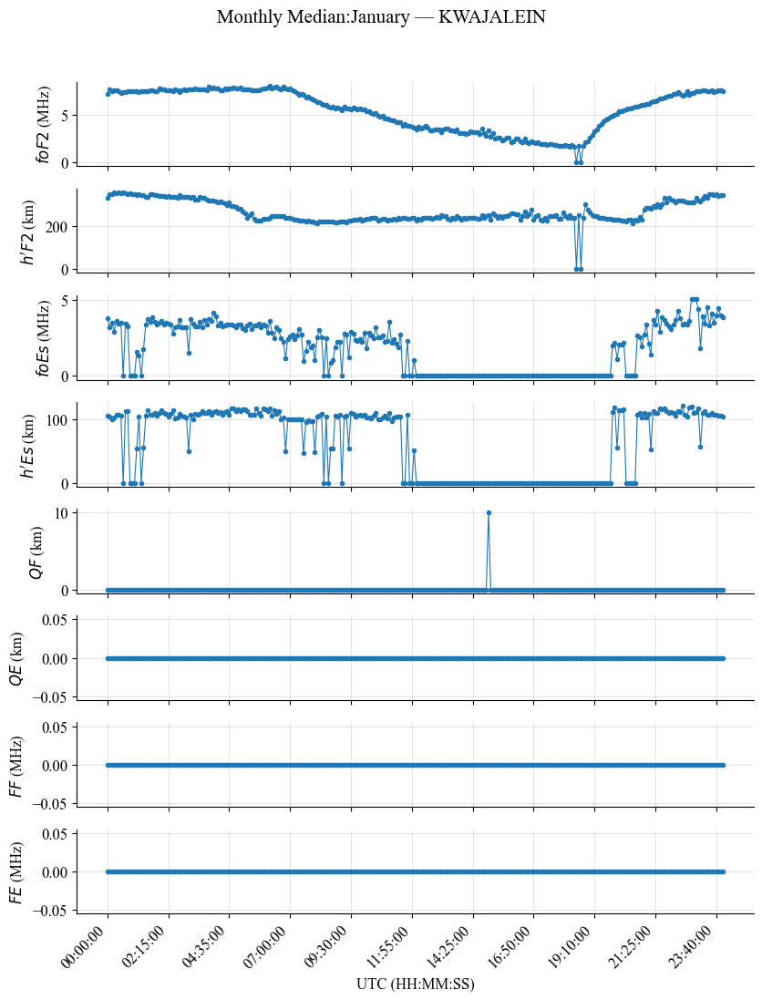

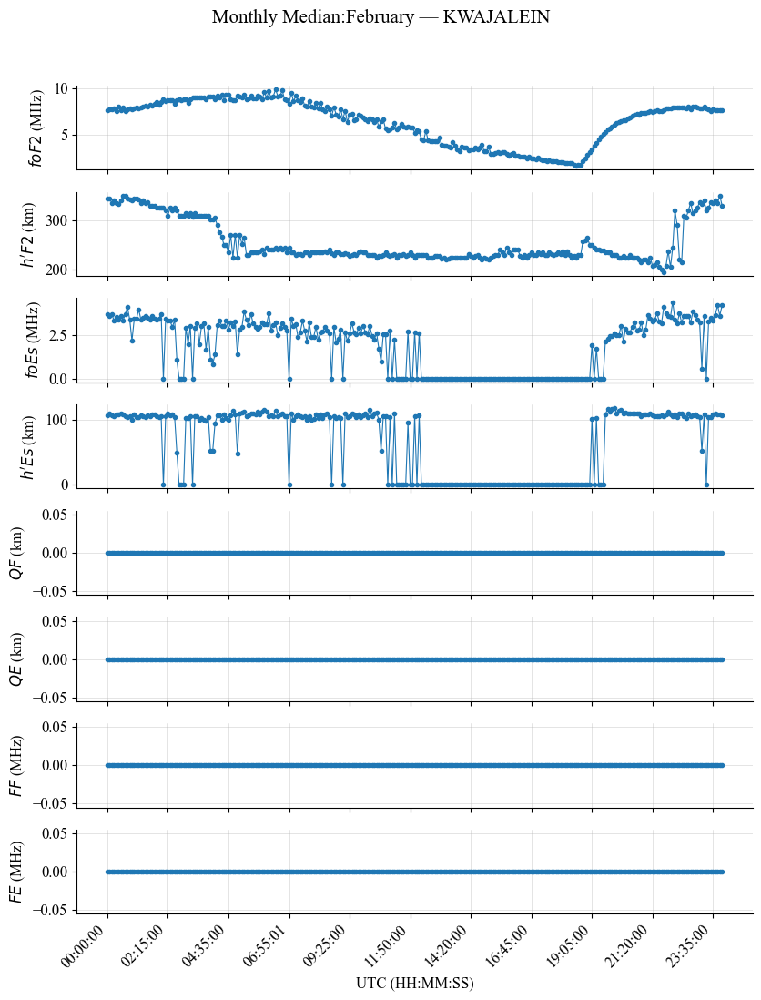

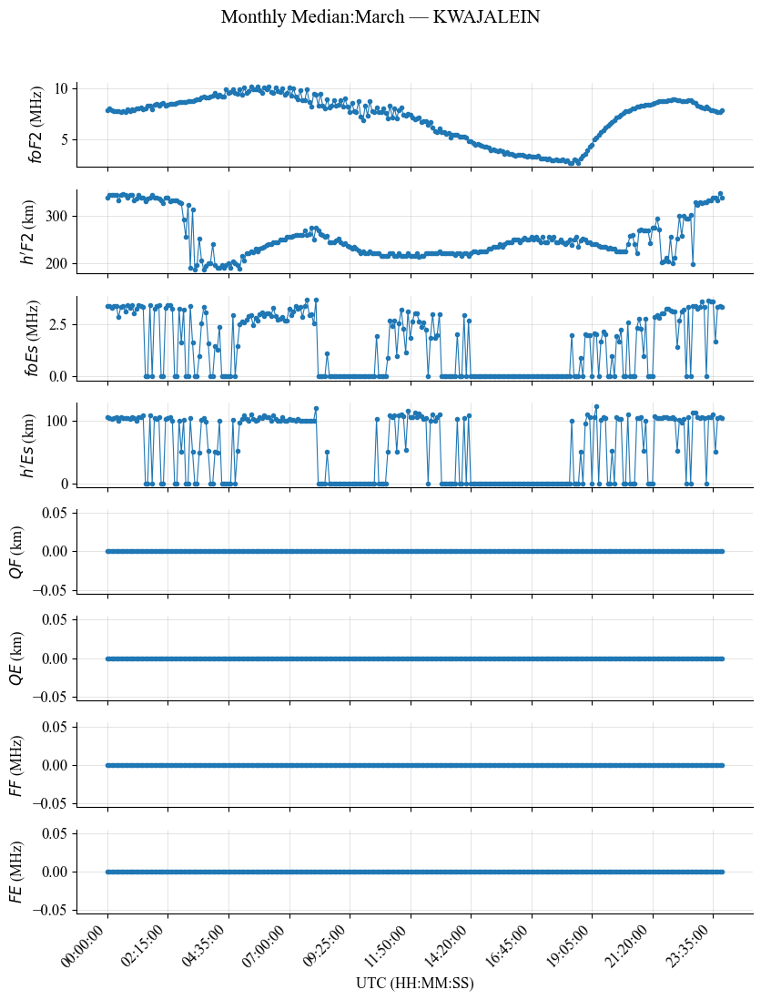

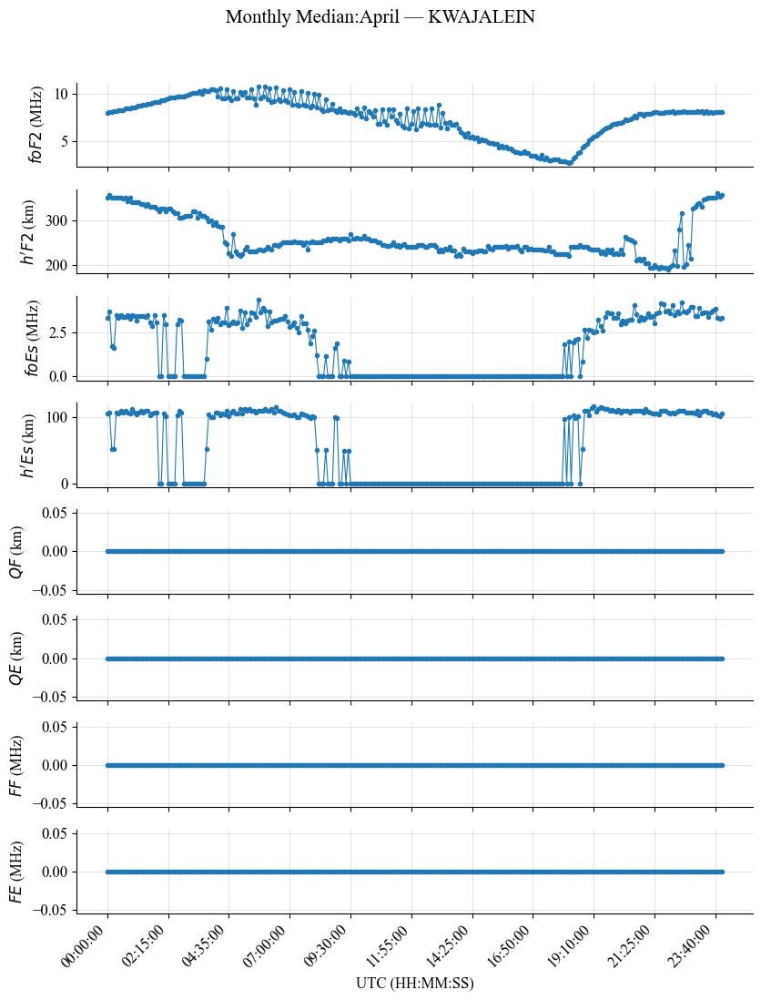

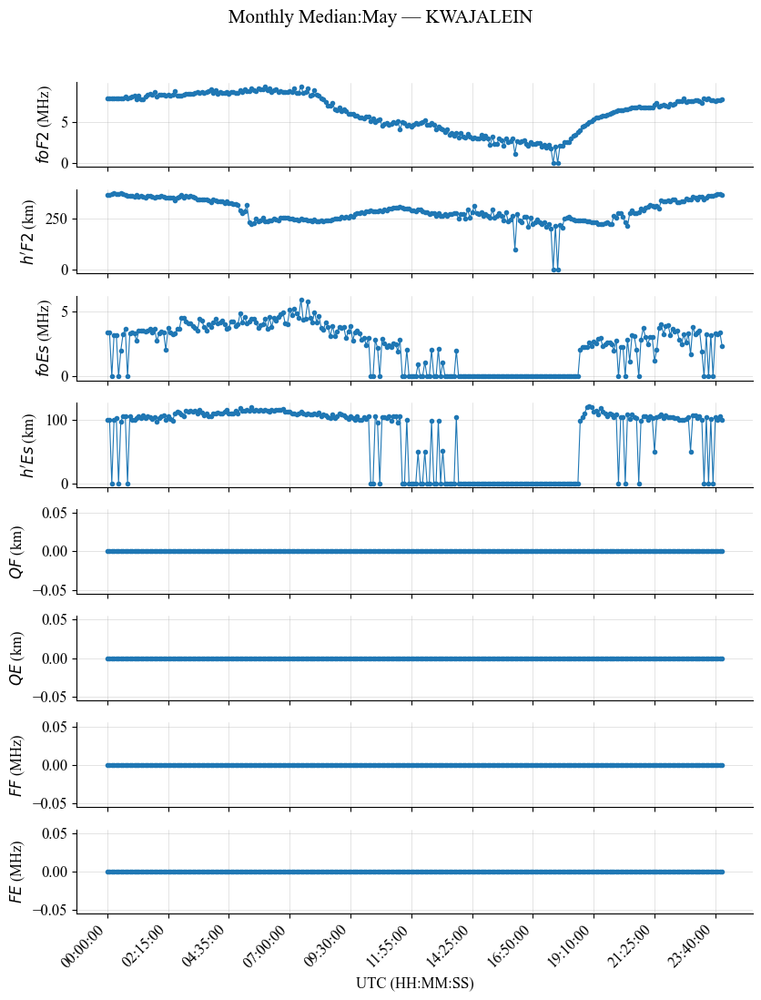

...

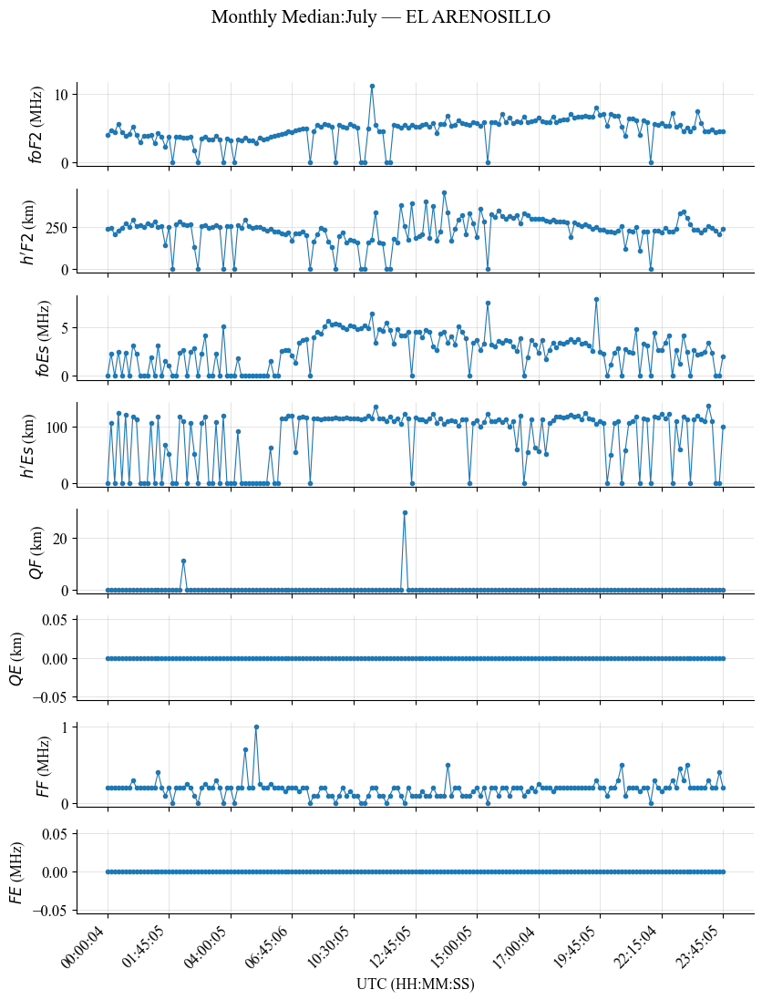

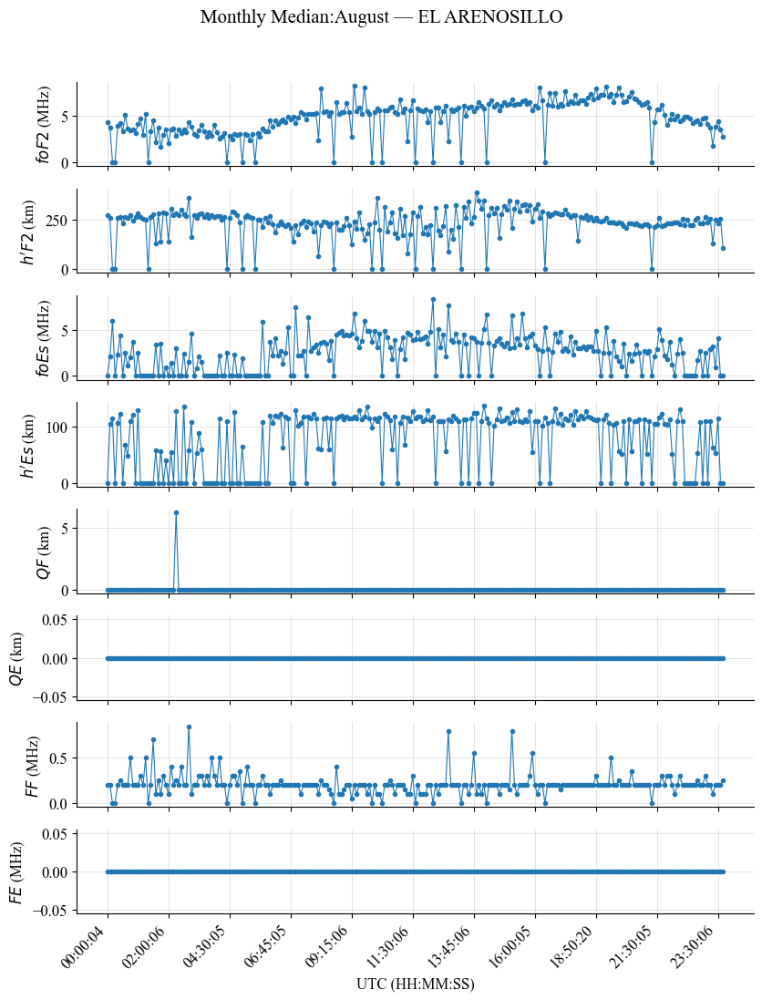

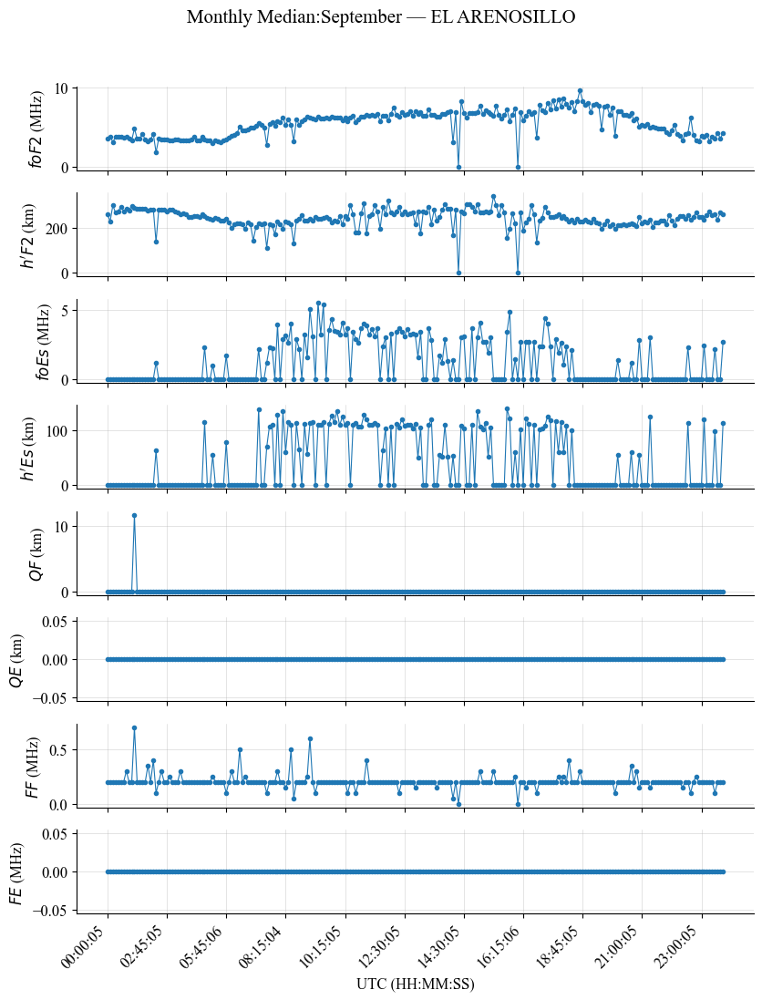

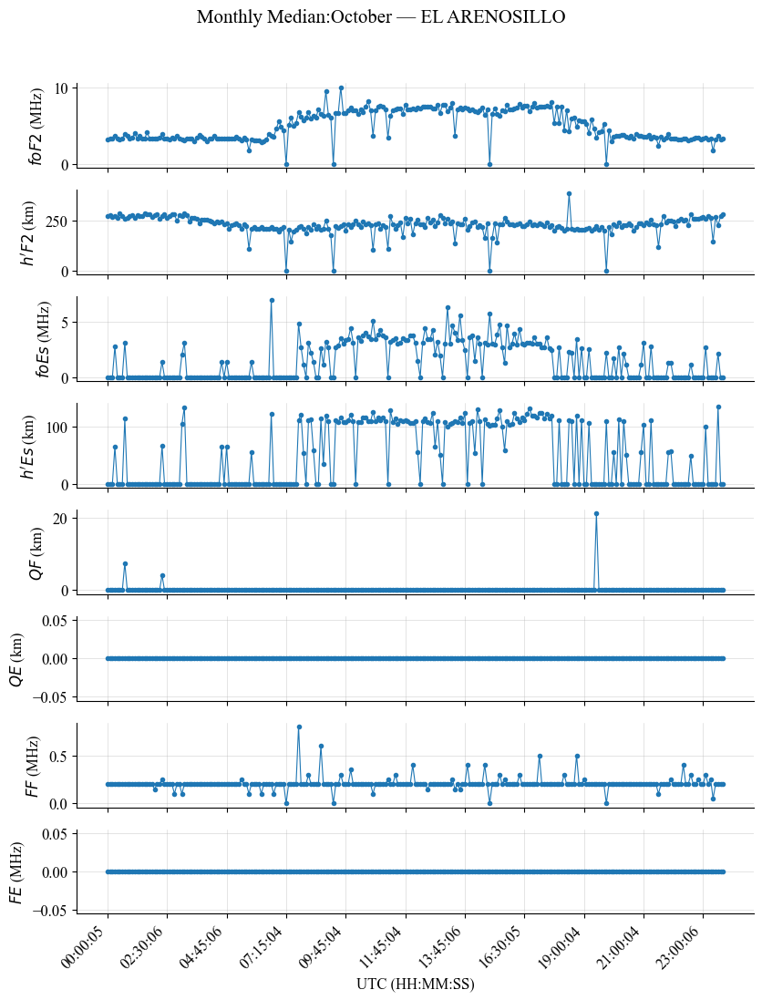

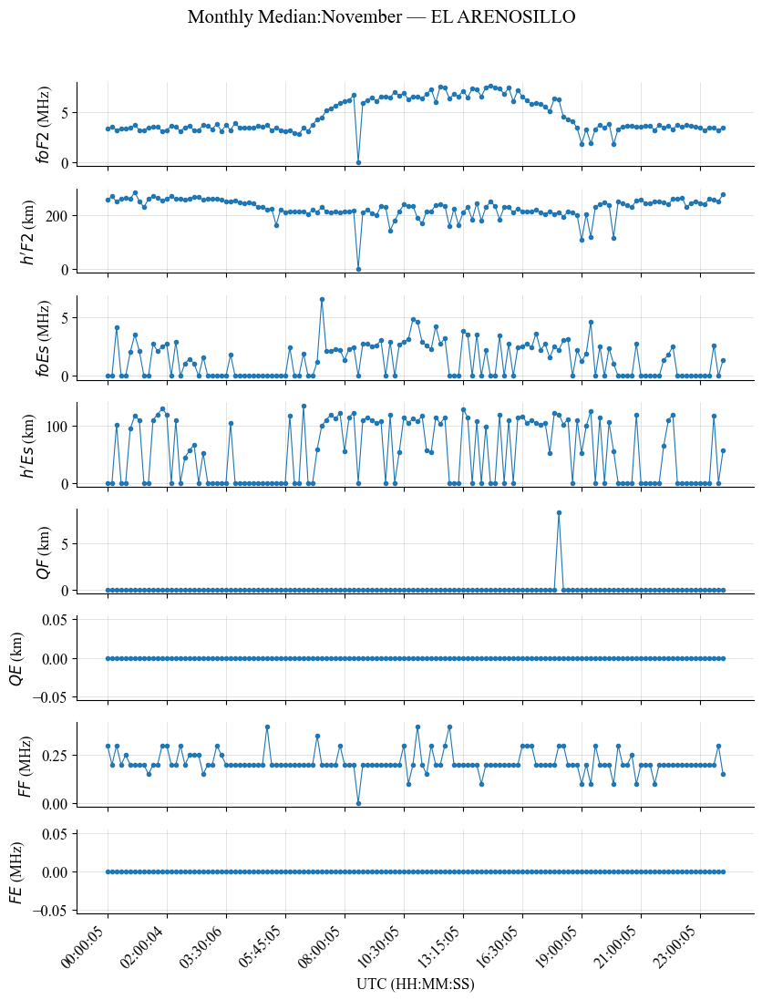

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# -----------------------------
# Plot formatting (publication)
# -----------------------------
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman"],
    "font.size": 11,
    "axes.titlesize": 14,
    "figure.titlesize": 15,
    "axes.labelsize": 12,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "legend.fontsize": 13
})

# Columns of interest (as in your code)
columns_to_plot = [
    'scaled_foF2','scaled_hF2','scaled_foEs',
    'scaled_hEs','scaled_qf','scaled_qe','scaled_ff','scaled_fe'
]
# 'scaled_foE'
# -----------------------------
# Pretty labels + units
# (edit if your units differ)
# -----------------------------
Y_LABELS = {
    "scaled_foF2": r"$foF2$ (MHz)",
    "scaled_hF2":  r"$h'F2$ (km)",
    # "scaled_foE":  r"$foE$ (MHz)",
    "scaled_foEs": r"$foEs$ (MHz)",
    "scaled_hEs":  r"$h'Es$ (km)",
    "scaled_qf":   r"$QF$ (km)",
    "scaled_qe":   r"$QE$ (km)",
    "scaled_ff":   r"$FF$ (MHz)",
    "scaled_fe":   r"$FE$ (MHz)",
}


# If you want titles without "scaled_"
def clean_name(col: str) -> str:
    return col.replace("scaled_", "")

# Month order
month_order = [
    'January', 'February', 'March', 'April', 'May', 'June',
    'July', 'August', 'September', 'October', 'November', 'December'
]

# Loop through each station to generate separate plots
for station, file_path in digisonde_files.items():
    df = pd.read_pickle(file_path)

    # Ensure datetime format for the timestamp
    df['sounding_timestamp'] = pd.to_datetime(df['sounding_timestamp'])

    # Replace fill value with 0 (or consider NaN if you prefer)
    df[columns_to_plot] = df[columns_to_plot].replace(9999.0, 0.0)

    # Convert month/time for grouping
    df['month'] = df['sounding_timestamp'].dt.strftime('%B')
    df['time_only'] = df['sounding_timestamp'].dt.strftime('%H:%M:%S')

    # Group by month and time_only to calculate median
    monthly_avg = df.groupby(['month', 'time_only'])[columns_to_plot].median().reset_index()

    unique_months = [m for m in month_order if m in monthly_avg['month'].unique()]

    for month in unique_months:
        month_data = monthly_avg[monthly_avg['month'] == month].copy()

        # Create subplots
        nrows = len(columns_to_plot)
        fig, axs = plt.subplots(nrows, 1, figsize=(8.5, 11), sharex=True)

        # Main title
        fig.suptitle(f"Monthly Median:{month} — {station}", y=0.995)

        # Choose ~8–10 x ticks max
        time_labels = month_data['time_only'].values
        if len(time_labels) > 10:
            step = max(1, len(time_labels) // 10)
            selected_ticks = time_labels[::step]
        else:
            selected_ticks = time_labels

        for i, col in enumerate(columns_to_plot):
            ax = axs[i]

            ax.plot(
                month_data['time_only'],
                month_data[col],
                marker='o',
                markersize=3,
                linewidth=0.8
            )

            # Y label (pretty + units)
            ax.set_ylabel(Y_LABELS.get(col, clean_name(col)))

            # Grid (light, journal style)
            ax.grid(True, linewidth=0.4, alpha=0.6)

            # Optional: remove top/right spines for cleaner look
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)

            # Apply x ticks only once (shared x, but set ticks consistently)
            ax.set_xticks(selected_ticks)

        axs[-1].set_xlabel("UTC (HH:MM:SS)")
        axs[-1].set_xticklabels(selected_ticks, rotation=45, ha='right')

        # Layout
        plt.tight_layout(rect=[0, 0, 1, 0.97])

        # Save at 600 DPI
        outpath = fr"C:\PROJECT-DEMETER\Paper1\Plots\NOA\{month}-median_{station}.png"
        plt.savefig(outpath, dpi=600, bbox_inches="tight")
        plt.show()


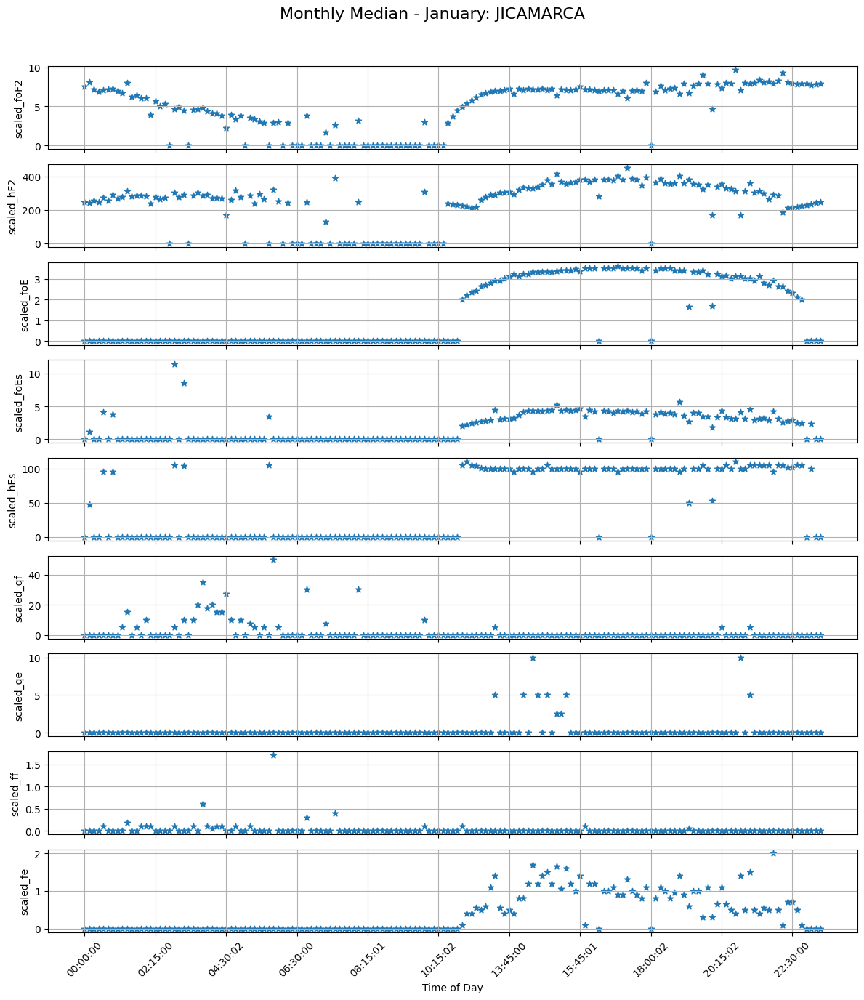

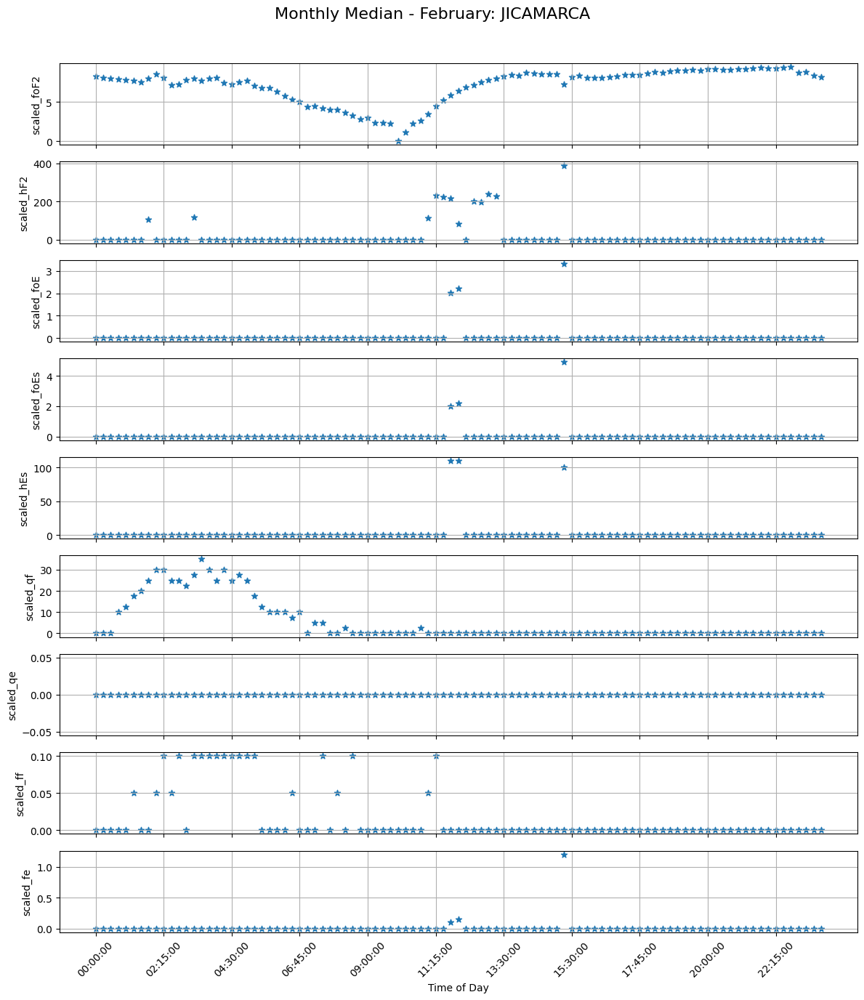

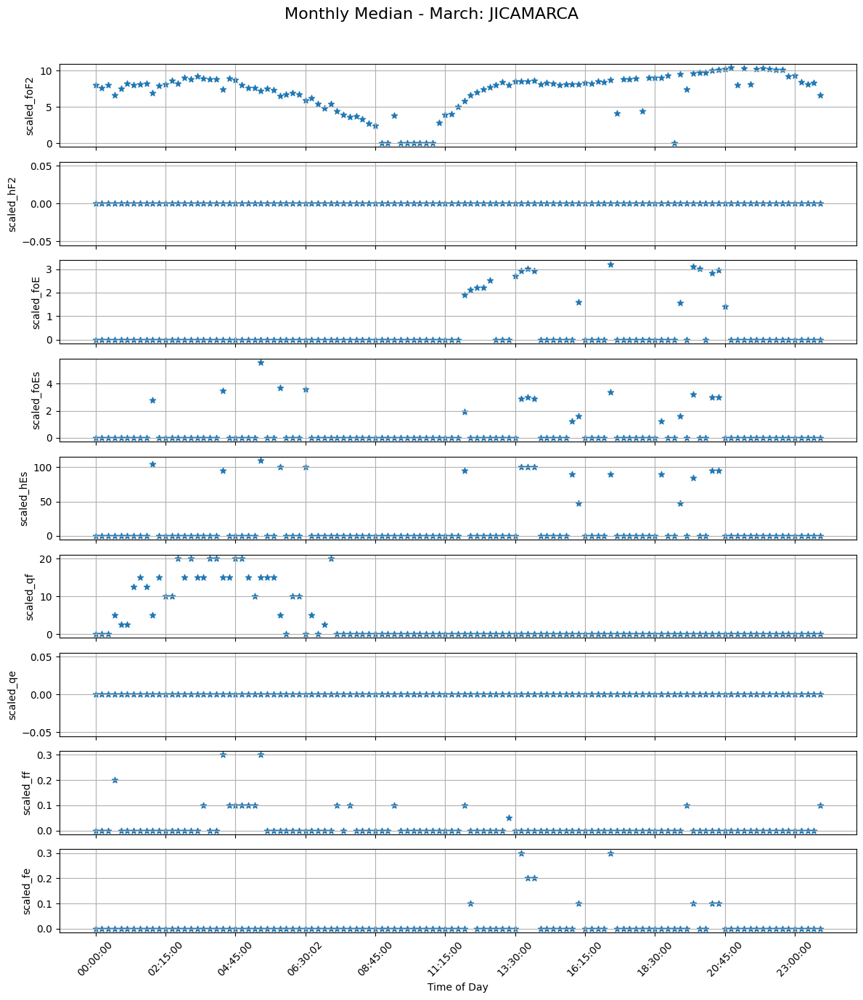

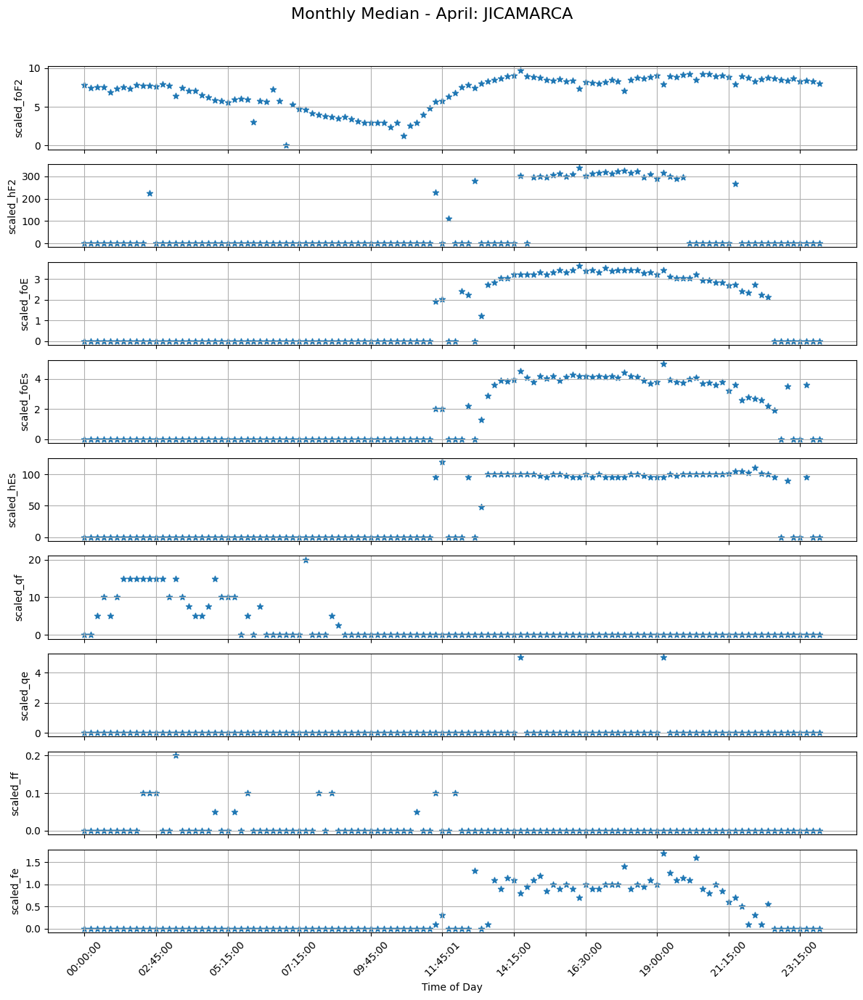

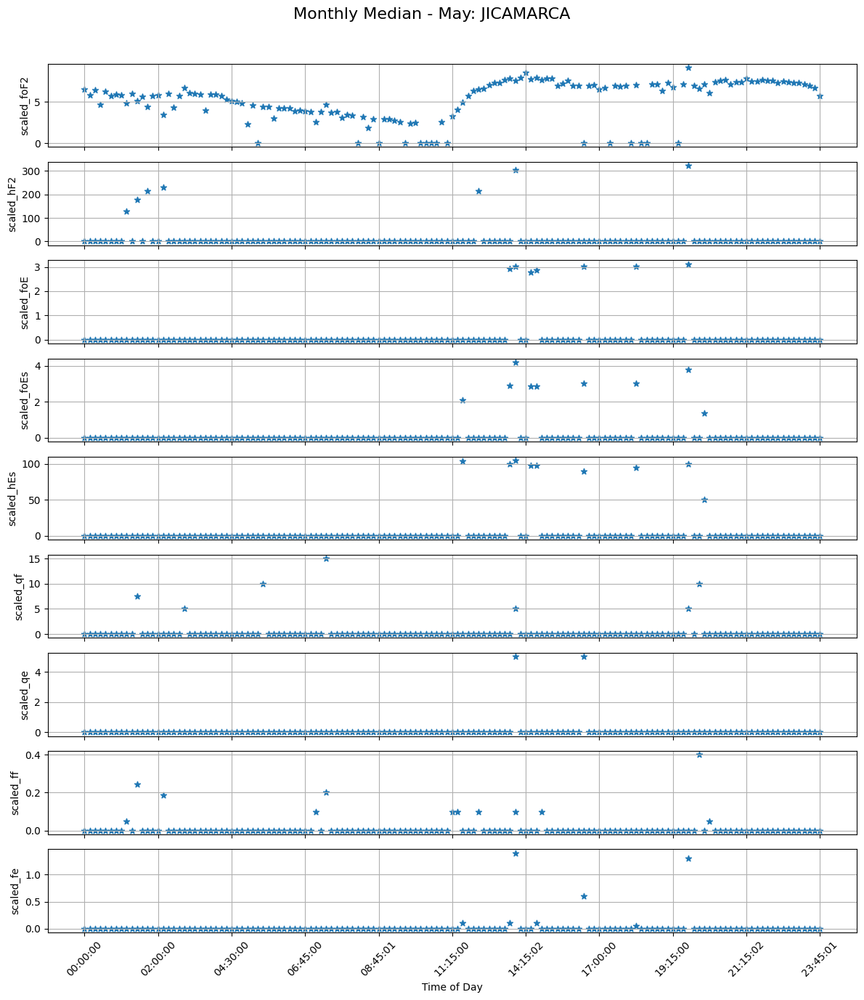

...

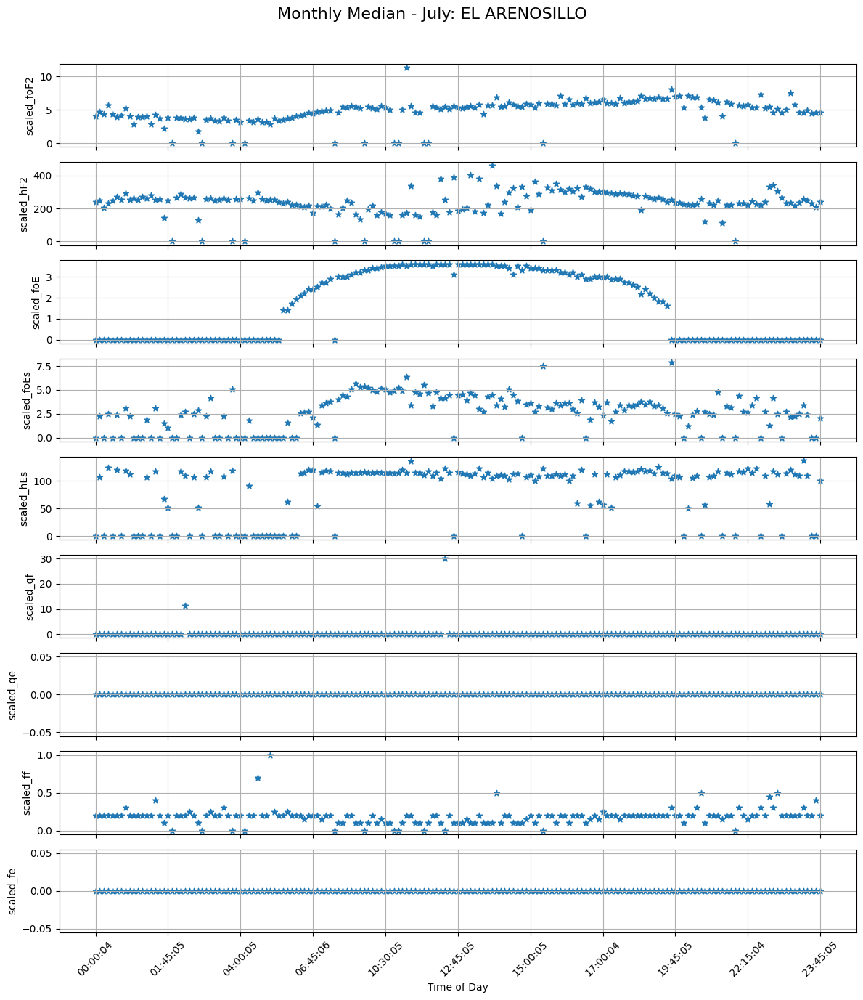

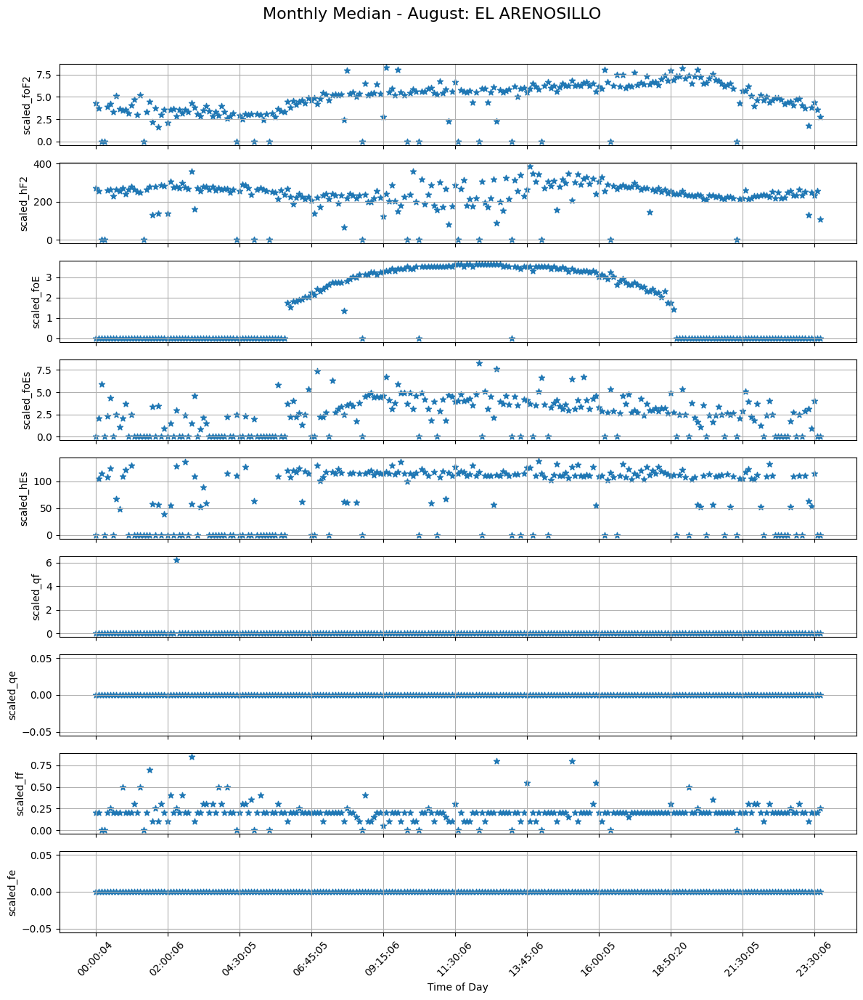

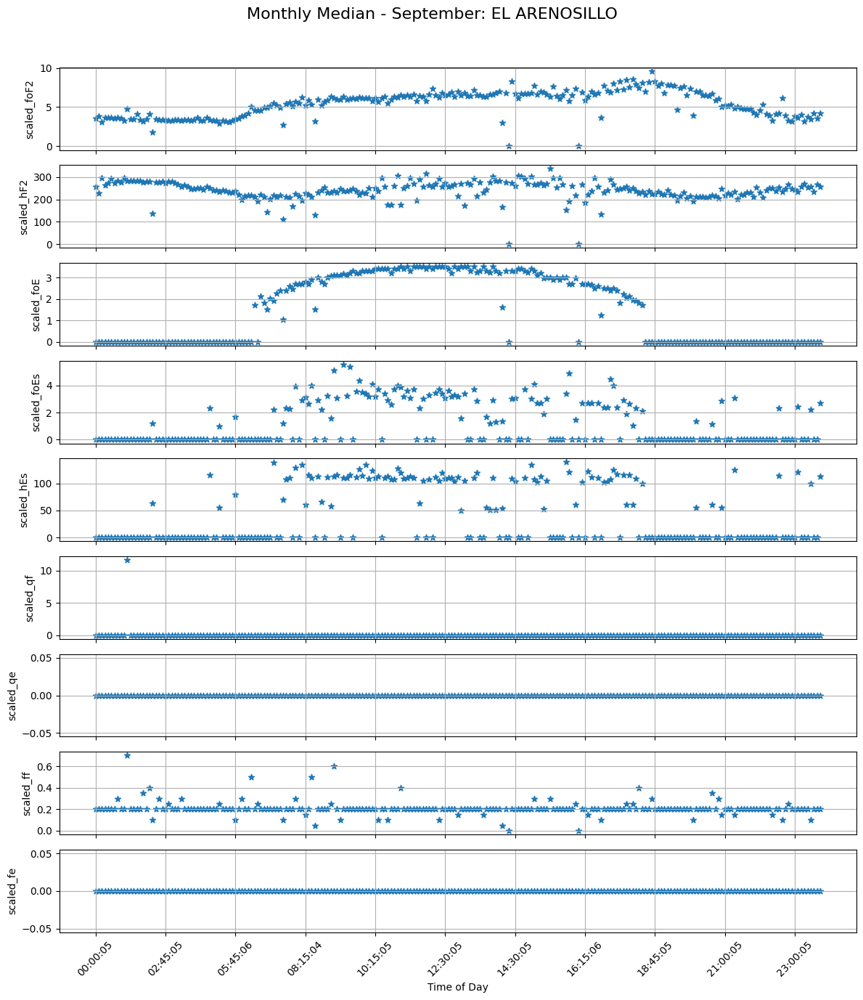

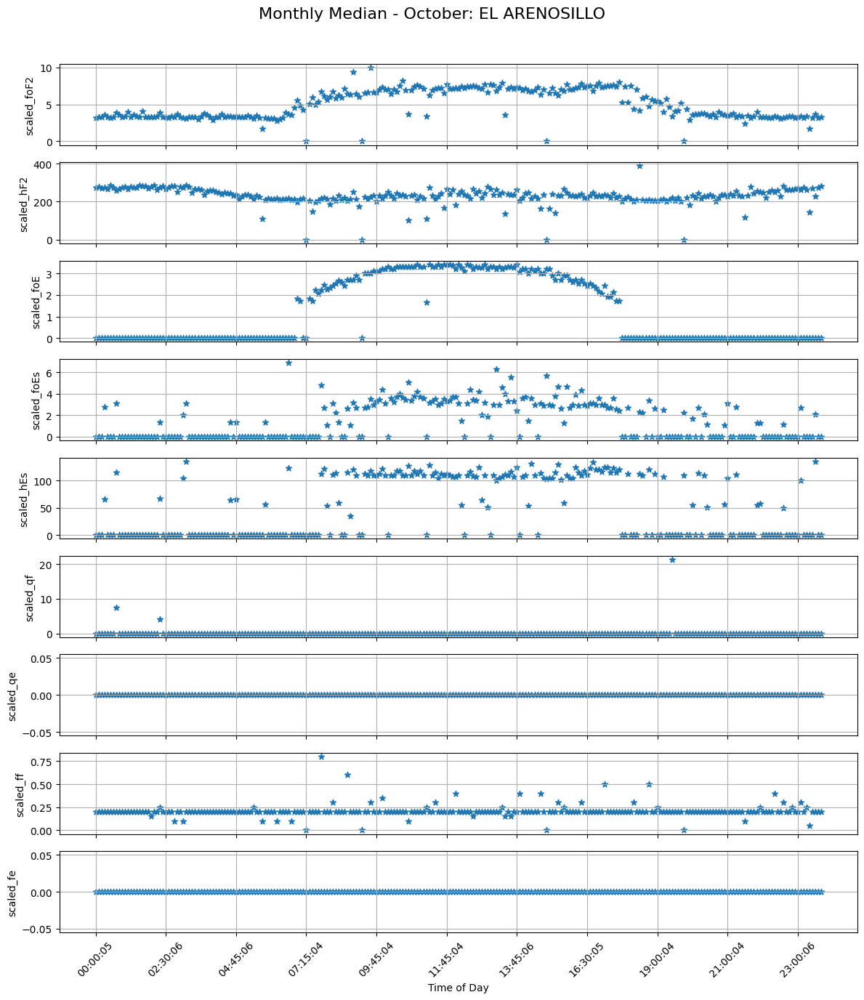

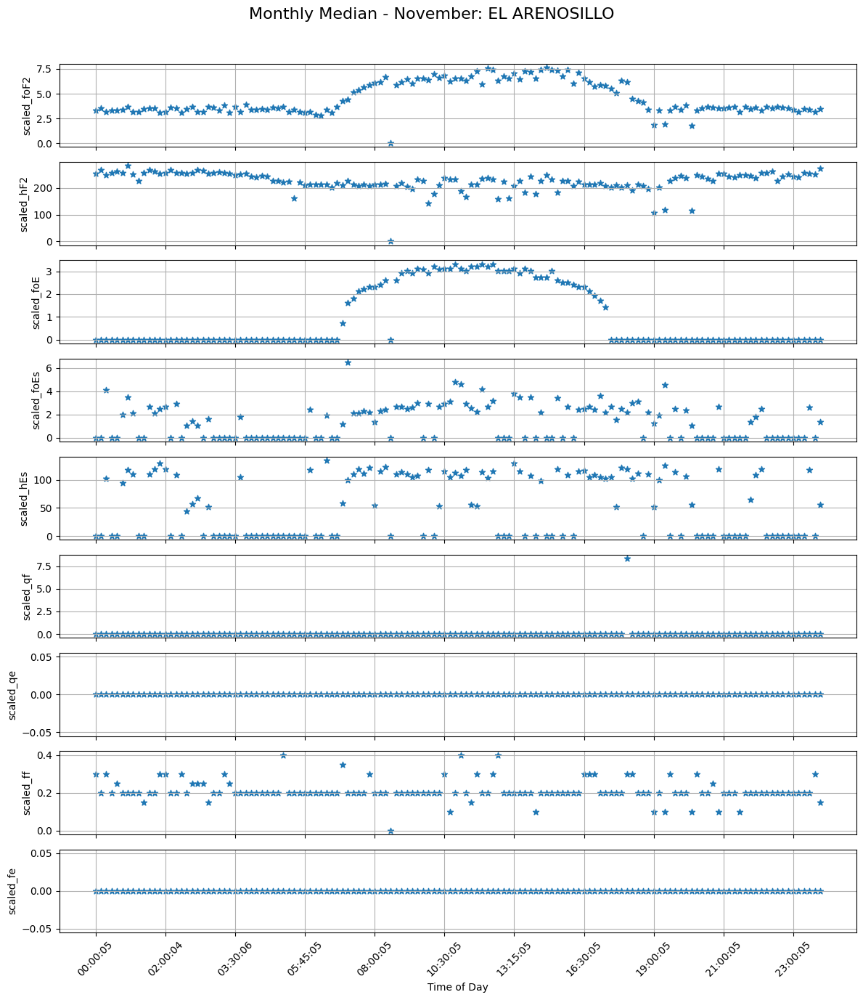

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Assume df is already prepared as you've described

# Columns to plot
# columns_to_plot = ['scaled_foF2', 'scaled_foEs', 'scaled_foE', 'scaled_hF2', 'scaled_hEs']
# Columns of interest
columns_to_plot = ['scaled_foF2','scaled_hF2','scaled_foE','scaled_foEs', 'scaled_hEs','scaled_qf','scaled_qe','scaled_ff','scaled_fe']
# columns_to_plot = ['scaled_foF2', 'scaled_foEs', 'scaled_foE', 'scaled_hF2', 'scaled_hEs']

# Loop through each station to generate separate plots
for station, file_path in digisonde_files.items():
    # Load the data for the current station
    df = pd.read_pickle(file_path)

    # Ensure datetime format for the timestamp
    df['sounding_timestamp'] = pd.to_datetime(df['sounding_timestamp'])
    df[columns_to_plot] = df[columns_to_plot].replace(9999.0, 0.0)
    # Convert 'month' to string for display
    df['month'] = df['sounding_timestamp'].dt.strftime('%B')  # Full month name
    df['time_only'] = df['sounding_timestamp'].dt.strftime('%H:%M:%S')

    # Group by month and time_only to calculate median
    monthly_avg = df.groupby(['month', 'time_only'])[columns_to_plot].median().reset_index()

    # Get sorted list of unique months in calendar order
    month_order = ['January', 'February', 'March', 'April', 'May', 'June',
                'July', 'August', 'September', 'October', 'November', 'December']
    unique_months = [m for m in month_order if m in monthly_avg['month'].unique()]

    # Plot for each month
    for month in unique_months:
        # Filter data for the current month
        month_data = monthly_avg[monthly_avg['month'] == month]

        # Create subplots for the 5 features
        fig, axs = plt.subplots(len(columns_to_plot), 1, figsize=(12, 14), sharex=True)
        fig.suptitle(f'Monthly Median - {month}: {station}', fontsize=16)

        for i, col in enumerate(columns_to_plot):
            ax = axs[i]
            ax.scatter(month_data['time_only'], month_data[col], marker='*')
            ax.set_ylabel(f'{col}')
            ax.grid(True)
            # Get every Nth tick to limit total ticks to 10
            time_labels = month_data['time_only'].values
            if len(time_labels) > 10:
                step = max(1, len(time_labels) // 10)
                selected_ticks = time_labels[::step]
            else:
                selected_ticks = time_labels

            ax.set_xticks(selected_ticks)
            ax.set_xticklabels(selected_ticks, rotation=45)


            # Annotate median values (skip 0s and NaNs)
        # for x, y in zip(month_data['time_only'], month_data[col]):
        #     if y != 0 and not pd.isna(y):
        #         ax.text(x, y, f'{y:.2f}', color='red', fontsize=8, ha='center', va='bottom')

            axs[-1].set_xlabel('Time of Day')
        plt.tight_layout(rect=[0, 0, 1, 0.96]) 
            # plt.subplots_adjust(top=0.9)  # To make space for the main title
        plt.savefig(f'C:\\NOA\\Data\\Coincident\\plots\\{month}-median_{station}_All.png', dpi=300)
        plt.show() # Adjust layout to accommodate suptitle
        plt.show()


In [ ]:
import os

# Config
station = "WALLOPS IS"
base_path = "C:/NOA/Data/Coincident/plots"
output_file = os.path.join(base_path, f"{station}_All_Months_2010.html")

# Month order
month_order = ['January', 'February', 'March', 'April', 'May', 'June',
               'July', 'August', 'September', 'October', 'November', 'December']

# Get relevant files for the station
all_files = os.listdir(base_path)
station_files = [f for f in all_files if f.endswith(".html") and f"-median_{station}_" in f]

# Sort by month order
def month_sort_key(fname):
    month = fname.split("-")[0]
    return month_order.index(month) if month in month_order else 999

station_files_sorted = sorted(station_files, key=month_sort_key)

# Generate HTML
with open(output_file, 'w') as f:
    f.write("""<!DOCTYPE html>
<html>
<head>
  <meta charset="UTF-8">
  <title>{station} – Monthly Median Plots</title>
  <style>
    body { font-family: sans-serif; background: #f9f9f9; padding: 20px; }
    h2 { margin-top: 40px; }
    iframe { width: 100%; height: 800px; border: 1px solid #ccc; margin-top: 10px; }
  </style>
</head>
<body>
  <h1>Monthly Median Plots – {station}</h1>
""".replace("{station}", station))

    for file in station_files_sorted:
        month = file.split("-")[0]
        f.write(f"<h2>{month}</h2>\n")
        f.write(f'<iframe src="{file}"></iframe>\n')

    f.write("""
</body>
</html>
""")

print(f"✅ HTML file created: {output_file}")


✅ HTML file created: C:/NOA/Data/Coincident/plots\WALLOPS IS_All_Months_2010.html


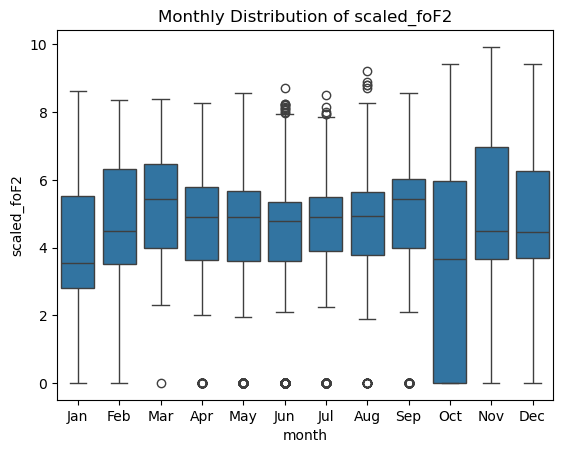

In [ ]:
df['month'] = df['sounding_timestamp'].dt.strftime('%b')  # Jan, Feb, etc.
sns.boxplot(x='month', y='scaled_foF2', data=df, order=['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
plt.title('Monthly Distribution of scaled_foF2')
plt.show()


In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

df_monthly = df.set_index('sounding_timestamp').resample('M')['scaled_foF2'].median()
result = seasonal_decompose(df_monthly, model='additive')
result.plot()
plt.show()


ModuleNotFoundError: No module named 'statsmodels'

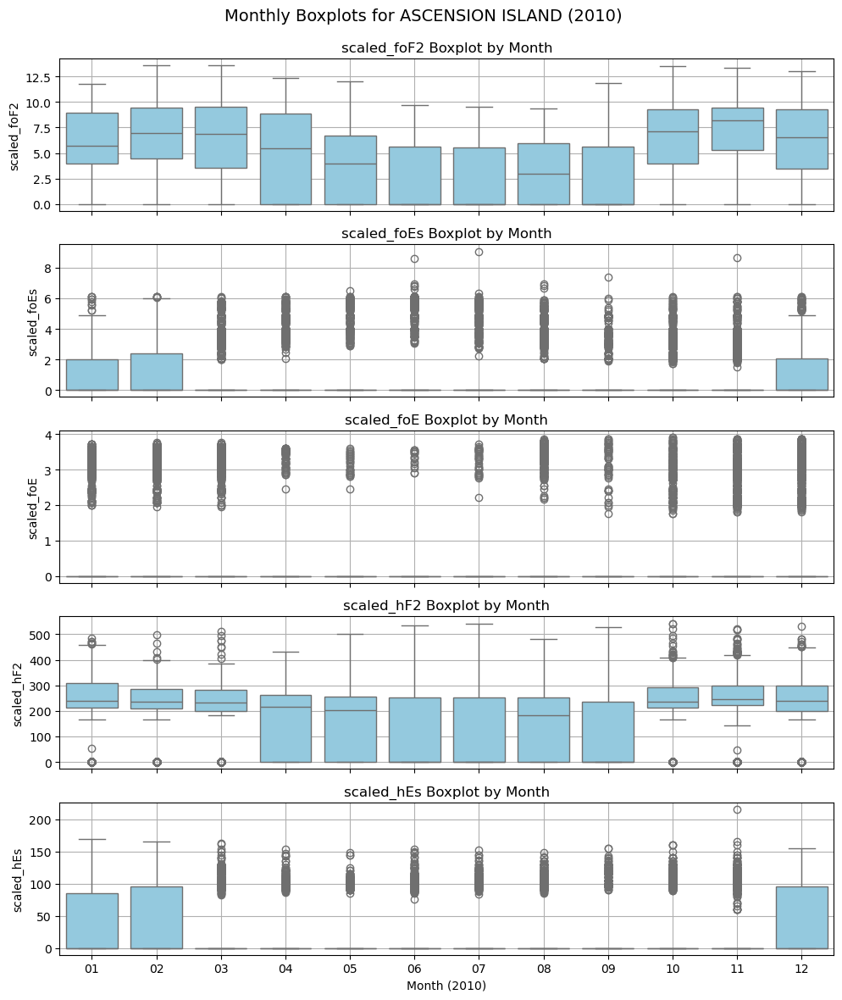

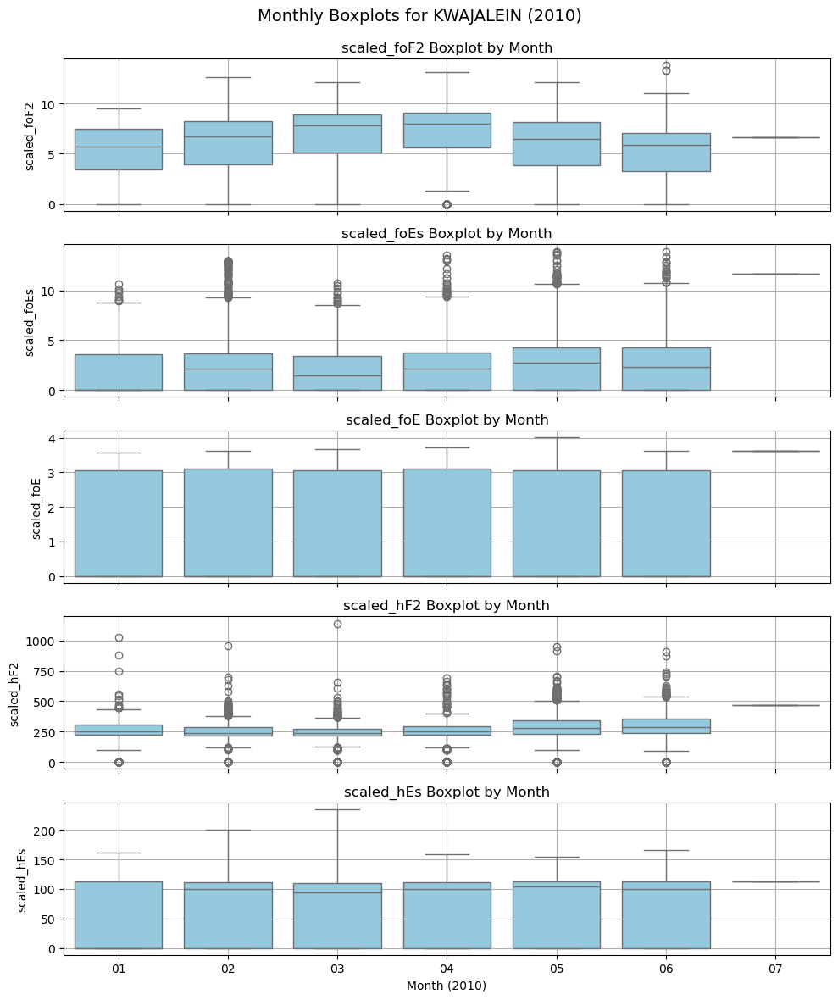

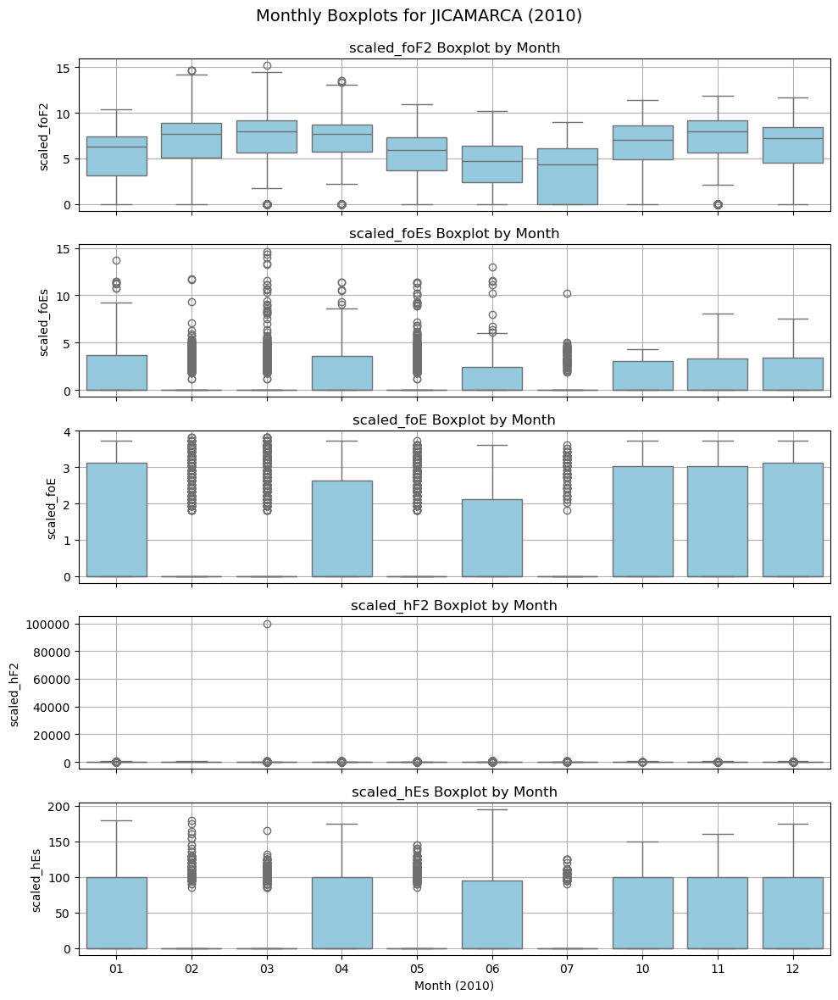

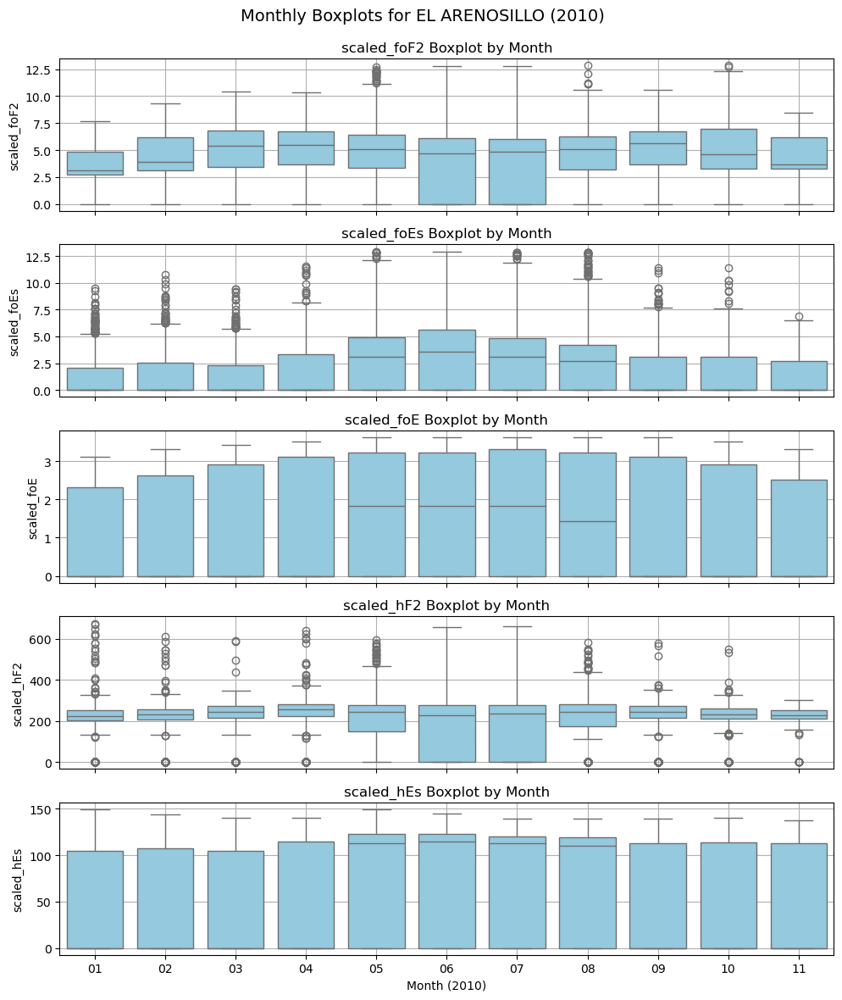

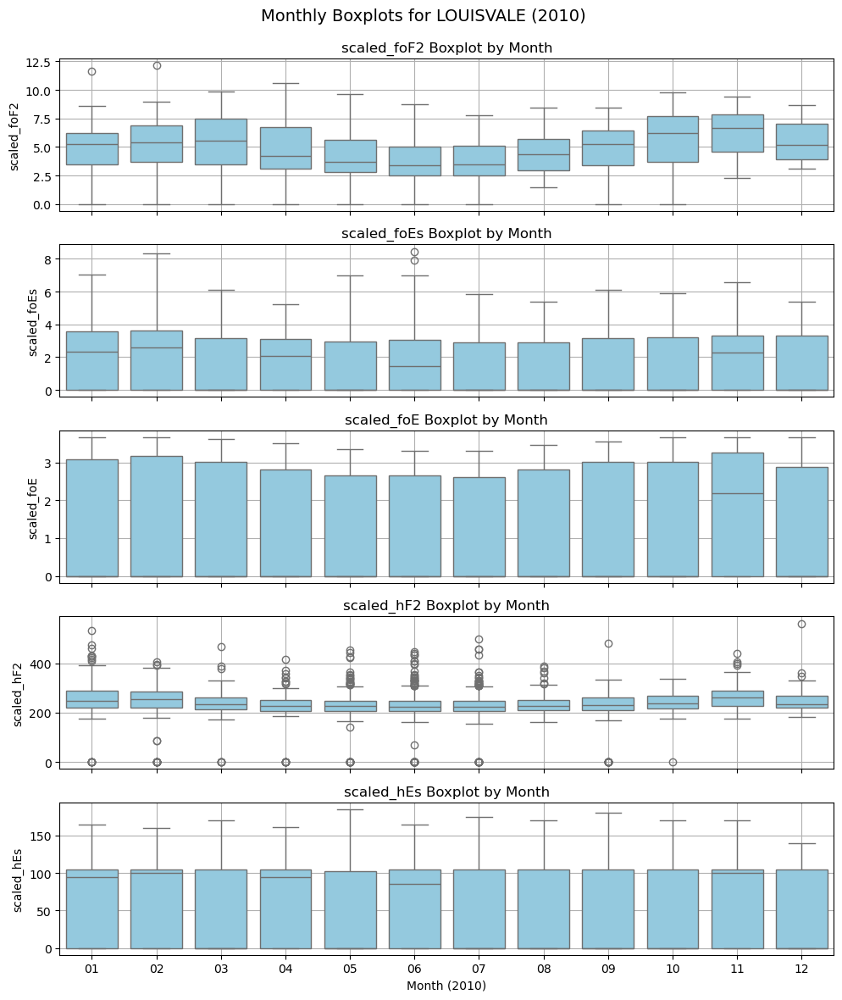

...

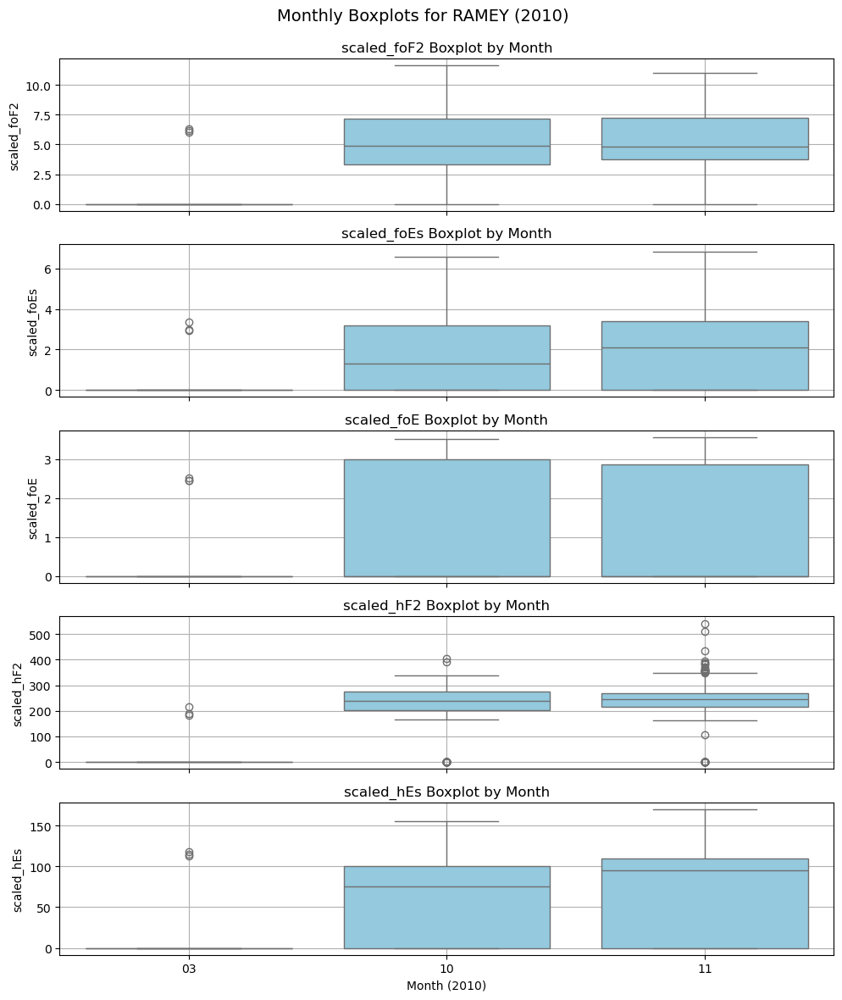

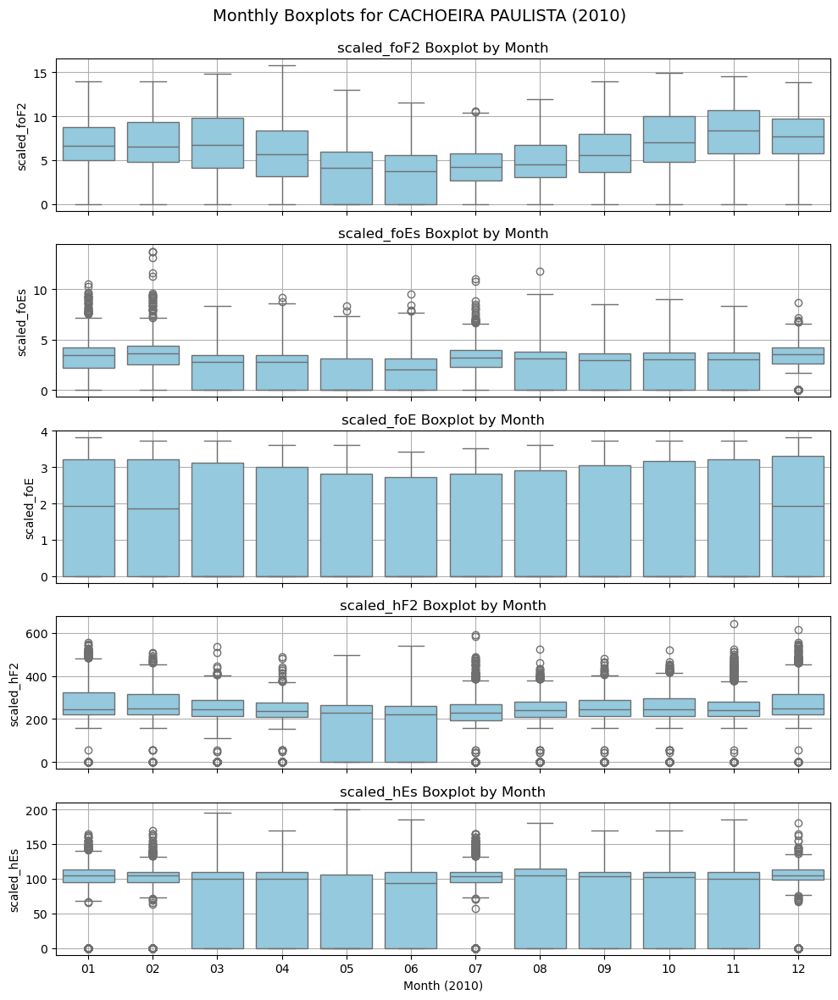

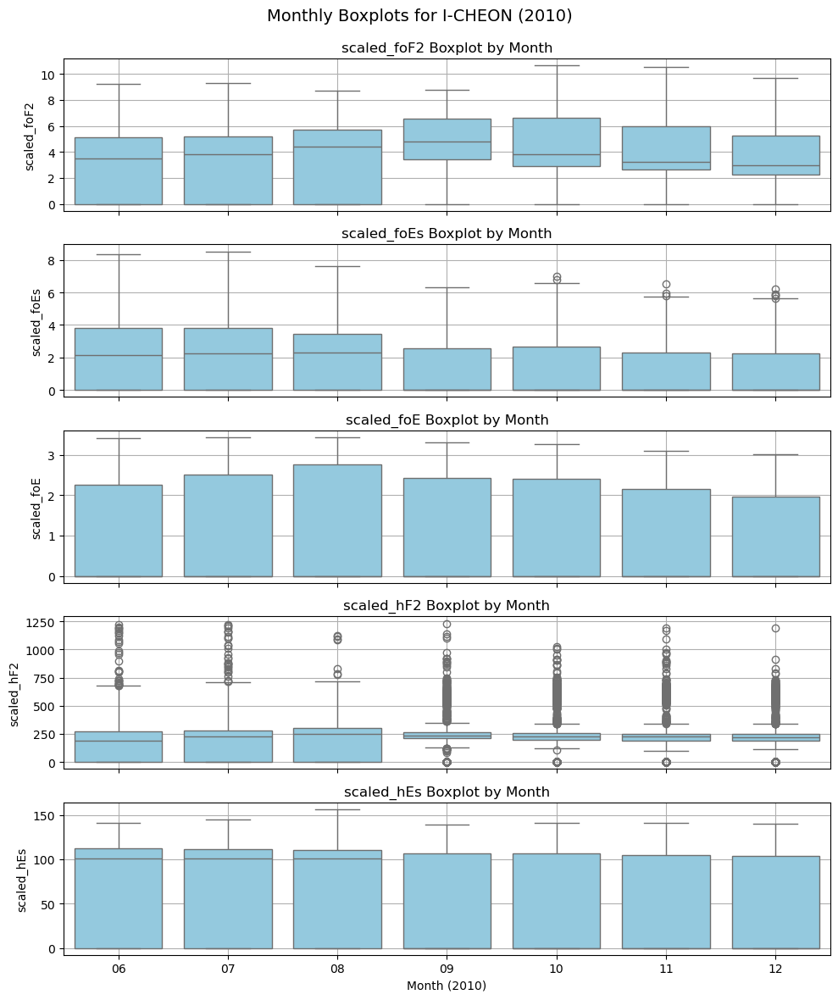

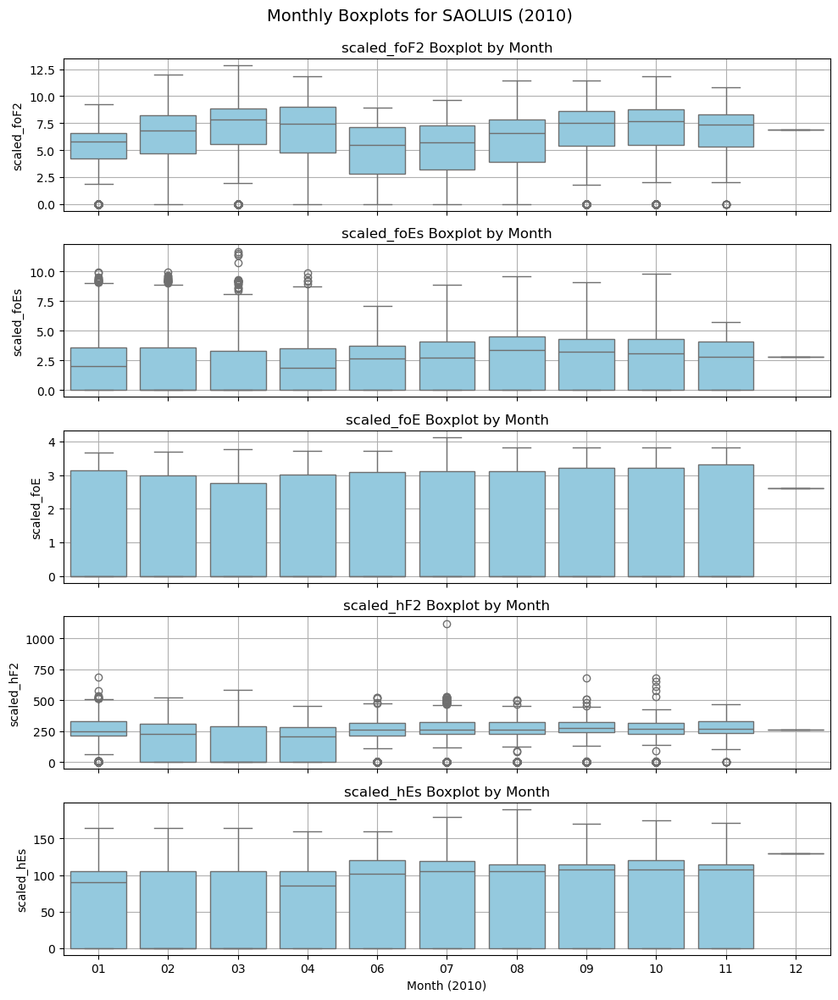

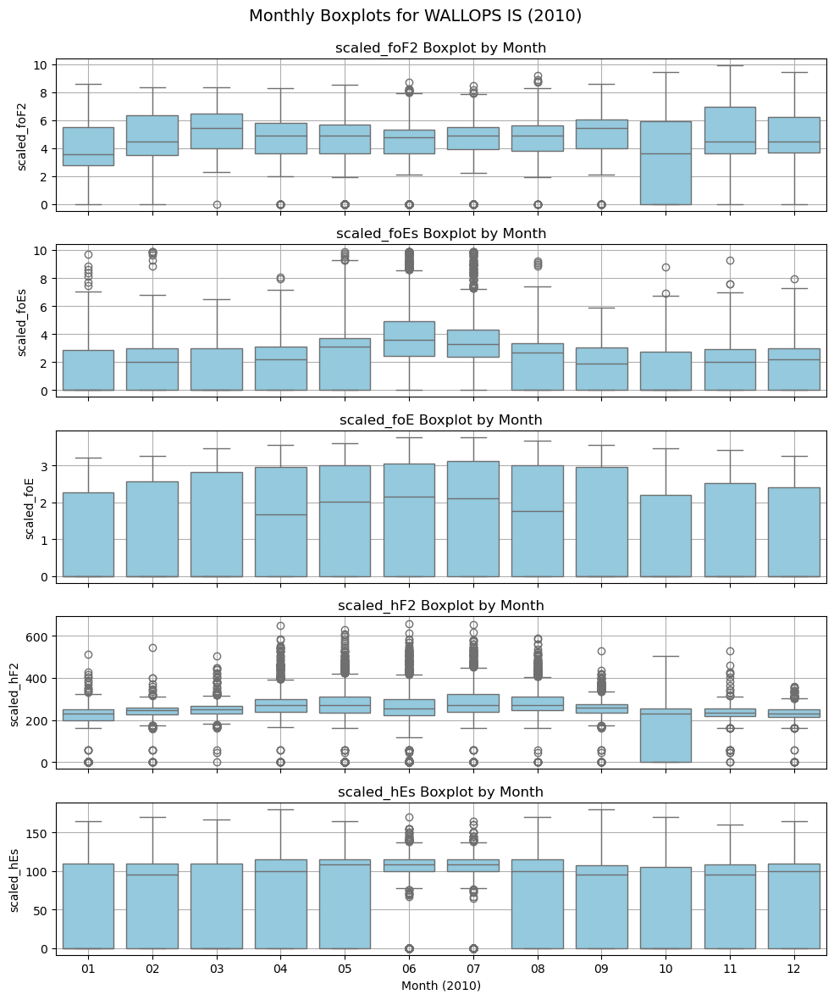

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define the columns you want to plot
columns_to_plot = ['scaled_foF2', 'scaled_foEs', 'scaled_foE', 'scaled_hF2', 'scaled_hEs']

# Loop through each station to generate separate plots
for station, file_path in digisonde_files.items():
    # Load the data for the current station
    df = pd.read_pickle(file_path)

    # Ensure datetime format for the timestamp
    df['sounding_timestamp'] = pd.to_datetime(df['sounding_timestamp'])

    # Keep only data from 2010
    df = df[df['sounding_timestamp'].dt.year == 2010]

    # Replace 9999.9 with 0.0
    df[columns_to_plot] = df[columns_to_plot].replace(9999., 0.0)

    # Extract month as string (e.g. '01', '02', ..., '12') for labeling
    df['month'] = df['sounding_timestamp'].dt.strftime('%m')

    fig, axs = plt.subplots(len(columns_to_plot), 1, figsize=(10, 12), sharex=True)

    for i, col in enumerate(columns_to_plot):
        sns.boxplot(x='month', y=col, data=df, ax=axs[i], color='skyblue')
        axs[i].set_title(f'{col} Boxplot by Month')
        axs[i].set_ylabel(col)
        axs[i].grid(True)

    axs[-1].set_xlabel('Month (2010)')
    fig.suptitle(f'Monthly Boxplots for {station} (2010)', fontsize=14)
    plt.tight_layout()
    plt.subplots_adjust(top=0.93)  # Room for main title
    plt.show()
